# DeepLabCut Toolbox
https://github.com/AlexEMG/DeepLabCut

Nath\*, Mathis\* et al. *Using DeepLabCut for markerless pose estimation during behavior across species*, (under revision).

This notebook demonstrates the necessary steps to use DeepLabCut for your own project.
This shows the most simple code to do so, but many of the functions have additional features, so please check out the overview & the protocol paper!

This notebook illustrates how to:
- create a project
- extract training frames
- label the frames
- plot the labeled images
- create a training set
- train a network
- evaluate a network
- analyze a novel video
- create an automatically labeled video 
- plot the trajectories

*Note*: Refine a network based after the network was trained on just a few labeled images is illustrated in "Demo-labeledexample-MouseReaching.ipynb". This demo also contains an already labeled data set and is perhaps the best starting point for brand new users.

## Create a new project

It is always good idea to keep the projects seperate. This function creates a new project with subdirectories and a basic configuration file in the user defined directory otherwise the project is created in the current working directory.

You can always add new videos to the project at any stage of the project. 

In [1]:
import deeplabcut

In [4]:
#Direct Interaction

Edrive_files=['E:\\Video Files_Aligned by mice\\Cohort#3\\#3_03_IK_DI_3M_170803d.mpg',
'E:\\Video Files_Aligned by mice\\Cohort#3\\#3_03_IK_DI_1B_170622d.mpg',
'E:\\Video Files_Aligned by mice\\Cohort#3\\#3_03_IK_DI_2S_170728d.mpg',
'E:\\Video Files_Aligned by mice\\Cohort#7\\#7_00_SK_DI_1B_180116d.mpg',
'E:\\Video Files_Aligned by mice\\Cohort#7\\#7_00_SK_DI_2S_180212d.mpg',
'E:\\Video Files_Aligned by mice\\Cohort#7\\#7_00_SK_DI_3D_180214d.mpg']

import os

def get_full_filenames(dirname, extension='None'):
    full_filenames=[]
    filenames = os.listdir(dirname)
    for filename in filenames:
        full_filename = os.path.join(dirname, filename)
        if extension != "None":
            ext = os.path.splitext(full_filename)[-1]
            if extension.lower()==ext.lower(): 
                full_filenames.append(full_filename)
        else:
            full_filenames.append(full_filename)
    return full_filenames

task='DirectInteraction' # Enter the name of your experiment Task
experimenter='KAIST' # Enter the name of the experimenter
video=get_full_filenames("C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\DirectInteraction", extension='.mpg') # Enter the paths of your videos you want to grab frames from.
video.extend(Edrive_files);
deeplabcut.create_new_project(task,experimenter,video, working_directory='C:\\Users\\user\\Desktop',copy_videos=False) #change the working directory to where you want the folders created.

Created "C:\Users\user\Desktop\DirectInteraction-KAIST-2019-01-04\videos"
Created "C:\Users\user\Desktop\DirectInteraction-KAIST-2019-01-04\labeled-data"
Created "C:\Users\user\Desktop\DirectInteraction-KAIST-2019-01-04\training-datasets"
Created "C:\Users\user\Desktop\DirectInteraction-KAIST-2019-01-04\dlc-models"
Creating the symbolic link of the video
Created the symlink of C:\Users\user\Desktop\Video_files_Deeplabcut\DirectInteraction\0627_17h24m_Video.MPG to C:\Users\user\Desktop\DirectInteraction-KAIST-2019-01-04\videos\0627_17h24m_Video.MPG
Created the symlink of C:\Users\user\Desktop\Video_files_Deeplabcut\DirectInteraction\0627_18h46m_Video.MPG to C:\Users\user\Desktop\DirectInteraction-KAIST-2019-01-04\videos\0627_18h46m_Video.MPG
Created the symlink of C:\Users\user\Desktop\Video_files_Deeplabcut\DirectInteraction\0627_19h24m_Video.MPG to C:\Users\user\Desktop\DirectInteraction-KAIST-2019-01-04\videos\0627_19h24m_Video.MPG
Created the symlink of C:\Users\user\Desktop\Video_f

'C:\\Users\\user\\Desktop\\DirectInteraction-KAIST-2019-01-04\\config.yaml'

## Extract frames from videos 
A key point for a successful feature detector is to select diverse frames, which are typical for the behavior you study that should be labeled.

This function selects N frames either uniformly sampled from a particular video (or folder) (algo=='uniform'). Note: this might not yield diverse frames, if the behavior is sparsely distributed (consider using kmeans), and/or select frames manually etc.

Also make sure to get select data from different (behavioral) sessions and different animals if those vary substantially (to train an invariant feature detector).

Individual images should not be too big (i.e. < 850 x 850 pixel). Although this can be taken care of later as well, it is advisable to crop the frames, to remove unnecessary parts of the frame as much as possible.

Always check the output of cropping. If you are happy with the results proceed to labeling.

In [2]:
%matplotlib inline
path_config_file = 'C:\\Users\\user\\Desktop\\DirectInteraction-KAIST-2019-01-04\\config.yaml' # Enter the path of the config file that was just created from the above step (check the folder)

In [3]:
deeplabcut.extract_frames(path_config_file,'automatic','kmeans',crop=True, checkcropping=False) #there are other ways to grab frames, such as by clustering 'kmeans'; please see the paper. 
#You can change the cropping to false, then delete the checkcropping part!

Reading config file successfully...
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 600.6  seconds.
Extracting and downsampling... 18000  frames from the video.


18000it [00:27, 657.49it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 600.6  seconds.
Extracting and downsampling... 17970  frames from the video.


17970it [00:29, 618.69it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 600.56  seconds.
Extracting and downsampling... 17999  frames from the video.


17999it [00:26, 667.87it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 600.53  seconds.
Extracting and downsampling... 18016  frames from the video.


18016it [00:28, 637.52it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 600.6  seconds.
Extracting and downsampling... 18000  frames from the video.


18000it [00:27, 643.68it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 600.59  seconds.
Extracting and downsampling... 18000  frames from the video.


18000it [00:28, 633.52it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 2603.77  seconds.
Extracting and downsampling... 78036  frames from the video.


78036it [02:34, 504.24it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 2169.97  seconds.
Extracting and downsampling... 65035  frames from the video.


65035it [02:02, 532.96it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 2163.56  seconds.
Extracting and downsampling... 64842  frames from the video.


64842it [02:01, 532.98it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 2179.08  seconds.
Extracting and downsampling... 65308  frames from the video.


65308it [02:03, 529.07it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 2154.42  seconds.
Extracting and downsampling... 64569  frames from the video.


64569it [02:04, 517.71it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 2141.14  seconds.
Extracting and downsampling... 64171  frames from the video.


64171it [02:01, 528.22it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 2140.91  seconds.
Extracting and downsampling... 64164  frames from the video.


64164it [02:05, 511.90it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 2148.51  seconds.
Extracting and downsampling... 64391  frames from the video.


64391it [02:00, 533.69it/s]


Kmeans clustering ... (this might take a while)
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on kmeans ...
Kmeans-quantization based extracting of frames from 0.0  seconds to 2143.55  seconds.
Extracting and downsampling... 64243  frames from the video.


64243it [01:58, 540.11it/s]


Kmeans clustering ... (this might take a while)

Frames are selected.
You can now label the frames using the function 'label_frames'.


## Label the extracted frames
Only videos in the config file can be used to extract the frames. Extracted labels for each video are stored in the project directory under the subdirectory **'labeled-data'**. Each subdirectory is named after the name of the video. The toolbox has a labeling toolbox which could be used for labeling. 

Working on folder: #3_03_IK_DI_1B_170622d
[[[30 27 12]
  [32 29 14]
  [32 29 14]
  ...
  [35 27 14]
  [35 27 14]
  [35 27 14]]

 [[30 27 12]
  [30 27 12]
  [32 29 14]
  ...
  [31 23 10]
  [31 23 10]
  [31 23 10]]

 [[30 27 12]
  [30 27 12]
  [30 27 12]
  ...
  [29 21  8]
  [29 21  8]
  [29 21  8]]

 ...

 [[31 26 12]
  [31 26 12]
  [34 29 15]
  ...
  [24 20  0]
  [24 20  0]
  [24 20  0]]

 [[29 24 10]
  [30 25 11]
  [31 26 12]
  ...
  [24 20  0]
  [24 20  0]
  [24 20  0]]

 [[28 23  9]
  [29 24 10]
  [31 26 12]
  ...
  [24 20  0]
  [24 20  0]
  [24 20  0]]]


TypeError: vars() argument must have __dict__ attribute

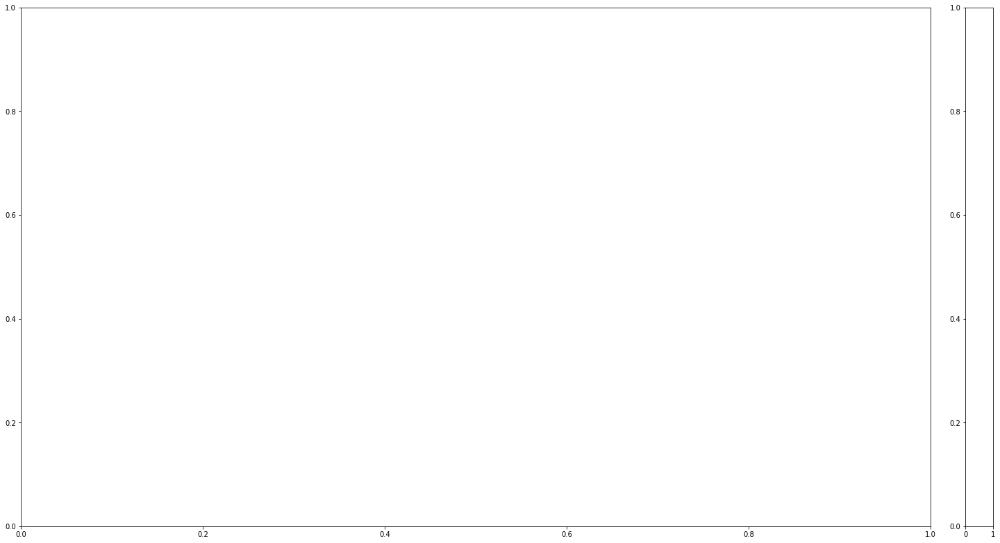

In [3]:
%gui wx
deeplabcut.label_frames(path_config_file, Screens=2, winHack=0.5, scale_w=0.9, scale_h=0.95, img_scale=0.012) 

**Check the labels**

Checking if the labels were created and stored correctly is beneficial for training, since labeling is one of the most critical parts for creating the training dataset. The DeepLabCut toolbox provides a function `check\_labels'  to do so. It is used as follows:

In [3]:
deeplabcut.check_labels(path_config_file) #this creates a subdirectory with the frames + your labels

Creating images with labels by KAIST.
They are stored in the following folder: C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial1_labeled.
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial10_labeled  already exists!
They are stored in the following folder: C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial10_labeled.
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial11_labeled  already exists!
They are stored in the following folder: C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial11_labeled.
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial12_labeled  already exists!
They are stored in the following folder: C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial12_labeled.
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial13_labeled  already exists!

If the labels need adjusted, you can use the refinement GUI to move them around! Check that out below.

## Create a training dataset
This function generates the training data information for DeepCut (which requires a mat file) based on the pandas dataframes that hold label information. The user can set the fraction of the training set size (from all labeled image in the hd5 file) in the config.yaml file. While creating the dataset, the user can create multiple shuffles. 

After running this script the training dataset is created and saved in the project directory under the subdirectory **'training-datasets'**

This function also creates new subdirectories under **dlc-models** and appends the project config.yaml file with the correct path to the training and testing pose configuration file. These files hold the parameters for training the network. Such an example file is provided with the toolbox and named as **pose_cfg.yaml**.

Now it is the time to start training the network!

In [9]:
deeplabcut.create_training_dataset(path_config_file)

C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\training-datasets\iteration-2\UnaugmentedDataSet_LinearChamberNov19  already exists!


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\user\\Desktop\\LinearChamber-KAIST-2018-11-19\\labeled-data\\20180906_Trial1\\img16890.png'

## Start training - If you want to use a CPU, continue. 
### If yu want to use your GPU, you need to exit here and either work from the Docker container, your own TensorFlow installation in an Anaconda env

This function trains the network for a specific shuffle of the training dataset. 

In [ ]:
#max_iter: c:\users\user\Anaconda3\envs\DLC2\Lib\site-packages\deeplabcut\pose_estimation_tensorflow\train.py에서 수정 가능.
#snapshot 위치: C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-0\LinearChamberNov19-trainset95shuffle1\train
#중간부터 retraining 하고 싶은 경우
#C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-0\LinearChamberNov19-trainset95shuffle1\train에서 pose_cfg.yaml을 찾아 init_weights를 다음과 같이 바꾼다.
#C:\Users\user\Anaconda3\envs\DLC2\lib\sitepackages\deeplabcut\pose_estimation_tensorflow\models\pretrained\resnet_v1_50.ckpt
deeplabcut.train_network(path_config_file, gputouse=0, max_snapshots_to_keep=None)

Config:
{'all_joints': [[0], [1], [2], [3]],
 'all_joints_names': ['Snout', 'LeftEar', 'RightEar', 'TailBase'],
 'batch_size': 1,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio': 0.4,
 'dataset': 'training-datasets\\iteration-2\\UnaugmentedDataSet_LinearChamberNov19\\LinearChamber_KAIST95shuffle1.mat',
 'dataset_type': 'default',
 'display_iters': 1000,
 'fg_fraction': 0.25,
 'global_scale': 0.8,
 'init_weights': 'C:\\Users\\user\\Anaconda3\\envs\\DLC2_COPY\\lib\\site-packages\\deeplabcut\\Pose_Estimation_Tensorflow\\models\\pretrained\\resnet_v1_101.ckpt',
 'intermediate_supervision': False,
 'intermediate_supervision_layer': 12,
 'leftwidth': 400,
 'location_refinement': True,
 'locref_huber_loss': True,
 'locref_loss_weight': 0.05,
 'locref_stdev': 7.2801,
 'log_dir': 'log',
 'max_input_size': 1000,
 'mean_pixel': [123.68, 116.779, 103.939],
 'metadataset': 'training-datasets\\iteration-2\\UnaugmentedDataSet_LinearChamberNov19\\Documentation_data-LinearChamber_95sh

INFO:tensorflow:Restoring parameters from C:\Users\user\Anaconda3\envs\DLC2_COPY\lib\site-packages\deeplabcut\Pose_Estimation_Tensorflow\models\pretrained\resnet_v1_101.ckpt


Restoring parameters from C:\Users\user\Anaconda3\envs\DLC2_COPY\lib\site-packages\deeplabcut\Pose_Estimation_Tensorflow\models\pretrained\resnet_v1_101.ckpt


Training parameter:
{'stride': 8.0, 'weigh_part_predictions': False, 'weigh_negatives': False, 'fg_fraction': 0.25, 'weigh_only_present_joints': False, 'mean_pixel': [123.68, 116.779, 103.939], 'shuffle': True, 'snapshot_prefix': 'C:\\Users\\user\\Desktop\\LinearChamber-KAIST-2018-11-19\\dlc-models\\iteration-2\\LinearChamberNov19-trainset95shuffle1\\train\\snapshot', 'log_dir': 'log', 'global_scale': 1.0, 'location_refinement': True, 'locref_stdev': 7.2801, 'locref_loss_weight': 0.05, 'locref_huber_loss': True, 'optimizer': 'sgd', 'intermediate_supervision': True, 'intermediate_supervision_layer': 12, 'regularize': True, 'weight_decay': 0.0001, 'mirror': True, 'crop_pad': 0, 'scoremap_dir': 'test', 'dataset_type': 'default', 'use_gt_segm': False, 'batch_size': 1, 'video': False, 'video_batch': False, 'crop': True, 'cropratio': 0.4, 'minsize': 100, 'leftwidth': 400, 'rightwidth': 400, 'topheight': 400, 'bottomheight': 400, 'all_joints': [[0], [1], [2], [3]], 'all_joints_names': ['Snout

iteration: 1000 loss: 0.0524 lr: 0.005
iteration: 2000 loss: 0.0373 lr: 0.005
iteration: 3000 loss: 0.0324 lr: 0.005
iteration: 4000 loss: 0.0293 lr: 0.005
iteration: 5000 loss: 0.0275 lr: 0.005
iteration: 6000 loss: 0.0263 lr: 0.005
iteration: 7000 loss: 0.0247 lr: 0.005
iteration: 8000 loss: 0.0236 lr: 0.005
iteration: 9000 loss: 0.0234 lr: 0.005
iteration: 10000 loss: 0.0223 lr: 0.005
iteration: 11000 loss: 0.0281 lr: 0.02
iteration: 12000 loss: 0.0255 lr: 0.02
iteration: 13000 loss: 0.0239 lr: 0.02
iteration: 14000 loss: 0.0233 lr: 0.02
iteration: 15000 loss: 0.0220 lr: 0.02
iteration: 16000 loss: 0.0218 lr: 0.02
iteration: 17000 loss: 0.0203 lr: 0.02
iteration: 18000 loss: 0.0206 lr: 0.02
iteration: 19000 loss: 0.0187 lr: 0.02
iteration: 20000 loss: 0.0193 lr: 0.02
iteration: 21000 loss: 0.0192 lr: 0.02
iteration: 22000 loss: 0.0183 lr: 0.02
iteration: 23000 loss: 0.0184 lr: 0.02
iteration: 24000 loss: 0.0172 lr: 0.02
iteration: 25000 loss: 0.0175 lr: 0.02
iteration: 26000 loss: 0

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-50000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-50000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 51000 loss: 0.0129 lr: 0.02
iteration: 52000 loss: 0.0123 lr: 0.02
iteration: 53000 loss: 0.0129 lr: 0.02
iteration: 54000 loss: 0.0116 lr: 0.02
iteration: 55000 loss: 0.0118 lr: 0.02
iteration: 56000 loss: 0.0121 lr: 0.02
iteration: 57000 loss: 0.0122 lr: 0.02
iteration: 58000 loss: 0.0118 lr: 0.02
iteration: 59000 loss: 0.0111 lr: 0.02
iteration: 60000 loss: 0.0119 lr: 0.02
iteration: 61000 loss: 0.0124 lr: 0.02
iteration: 62000 loss: 0.0117 lr: 0.02
iteration: 63000 loss: 0.0116 lr: 0.02
iteration: 64000 loss: 0.0113 lr: 0.02
iteration: 65000 loss: 0.0112 lr: 0.02
iteration: 66000 loss: 0.0105 lr: 0.02
iteration: 67000 loss: 0.0111 lr: 0.02
iteration: 68000 loss: 0.0105 lr: 0.02
iteration: 69000 loss: 0.0108 lr: 0.02
iteration: 70000 loss: 0.0106 lr: 0.02
iteration: 71000 loss: 0.01

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-100000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-100000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 101000 loss: 0.0090 lr: 0.02
iteration: 102000 loss: 0.0094 lr: 0.02
iteration: 103000 loss: 0.0088 lr: 0.02
iteration: 104000 loss: 0.0083 lr: 0.02
iteration: 105000 loss: 0.0086 lr: 0.02
iteration: 106000 loss: 0.0081 lr: 0.02
iteration: 107000 loss: 0.0084 lr: 0.02
iteration: 108000 loss: 0.0081 lr: 0.02
iteration: 109000 loss: 0.0084 lr: 0.02
iteration: 110000 loss: 0.0095 lr: 0.02
iteration: 111000 loss: 0.0086 lr: 0.02
iteration: 112000 loss: 0.0082 lr: 0.02
iteration: 113000 loss: 0.0081 lr: 0.02
iteration: 114000 loss: 0.0085 lr: 0.02
iteration: 115000 loss: 0.0077 lr: 0.02
iteration: 116000 loss: 0.0084 lr: 0.02
iteration: 117000 loss: 0.0083 lr: 0.02
iteration: 118000 loss: 0.0092 lr: 0.02
iteration: 119000 loss: 0.0081 lr: 0.02
iteration: 120000 loss: 0.0078 lr: 0.02
iterat

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-150000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-150000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 151000 loss: 0.0069 lr: 0.02
iteration: 152000 loss: 0.0073 lr: 0.02
iteration: 153000 loss: 0.0071 lr: 0.02
iteration: 154000 loss: 0.0069 lr: 0.02
iteration: 155000 loss: 0.0069 lr: 0.02
iteration: 156000 loss: 0.0067 lr: 0.02
iteration: 157000 loss: 0.0072 lr: 0.02
iteration: 158000 loss: 0.0069 lr: 0.02
iteration: 159000 loss: 0.0073 lr: 0.02
iteration: 160000 loss: 0.0068 lr: 0.02
iteration: 161000 loss: 0.0068 lr: 0.02
iteration: 162000 loss: 0.0067 lr: 0.02
iteration: 163000 loss: 0.0072 lr: 0.02
iteration: 164000 loss: 0.0068 lr: 0.02
iteration: 165000 loss: 0.0066 lr: 0.02
iteration: 166000 loss: 0.0063 lr: 0.02
iteration: 167000 loss: 0.0067 lr: 0.02
iteration: 168000 loss: 0.0062 lr: 0.02
iteration: 169000 loss: 0.0066 lr: 0.02
iteration: 170000 loss: 0.0073 lr: 0.02
iterat

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-200000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-200000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 201000 loss: 0.0059 lr: 0.02
iteration: 202000 loss: 0.0059 lr: 0.02
iteration: 203000 loss: 0.0059 lr: 0.02
iteration: 204000 loss: 0.0058 lr: 0.02
iteration: 205000 loss: 0.0055 lr: 0.02
iteration: 206000 loss: 0.0060 lr: 0.02
iteration: 207000 loss: 0.0058 lr: 0.02
iteration: 208000 loss: 0.0059 lr: 0.02
iteration: 209000 loss: 0.0072 lr: 0.02
iteration: 210000 loss: 0.0059 lr: 0.02
iteration: 211000 loss: 0.0057 lr: 0.02
iteration: 212000 loss: 0.0057 lr: 0.02
iteration: 213000 loss: 0.0058 lr: 0.02
iteration: 214000 loss: 0.0060 lr: 0.02
iteration: 215000 loss: 0.0056 lr: 0.02
iteration: 216000 loss: 0.0057 lr: 0.02
iteration: 217000 loss: 0.0056 lr: 0.02
iteration: 218000 loss: 0.0061 lr: 0.02
iteration: 219000 loss: 0.0056 lr: 0.02
iteration: 220000 loss: 0.0057 lr: 0.02
iterat

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-250000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-250000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 251000 loss: 0.0052 lr: 0.02
iteration: 252000 loss: 0.0054 lr: 0.02
iteration: 253000 loss: 0.0052 lr: 0.02
iteration: 254000 loss: 0.0054 lr: 0.02
iteration: 255000 loss: 0.0058 lr: 0.02
iteration: 256000 loss: 0.0055 lr: 0.02
iteration: 257000 loss: 0.0051 lr: 0.02
iteration: 258000 loss: 0.0054 lr: 0.02
iteration: 259000 loss: 0.0052 lr: 0.02
iteration: 260000 loss: 0.0055 lr: 0.02
iteration: 261000 loss: 0.0052 lr: 0.02
iteration: 262000 loss: 0.0055 lr: 0.02
iteration: 263000 loss: 0.0052 lr: 0.02
iteration: 264000 loss: 0.0052 lr: 0.02
iteration: 265000 loss: 0.0054 lr: 0.02
iteration: 266000 loss: 0.0051 lr: 0.02
iteration: 267000 loss: 0.0051 lr: 0.02
iteration: 268000 loss: 0.0047 lr: 0.02
iteration: 269000 loss: 0.0056 lr: 0.02
iteration: 270000 loss: 0.0059 lr: 0.02
iterat

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-300000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-300000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 301000 loss: 0.0050 lr: 0.02
iteration: 302000 loss: 0.0048 lr: 0.02
iteration: 303000 loss: 0.0053 lr: 0.02
iteration: 304000 loss: 0.0049 lr: 0.02
iteration: 305000 loss: 0.0050 lr: 0.02
iteration: 306000 loss: 0.0051 lr: 0.02
iteration: 307000 loss: 0.0050 lr: 0.02
iteration: 308000 loss: 0.0052 lr: 0.02
iteration: 309000 loss: 0.0050 lr: 0.02
iteration: 310000 loss: 0.0050 lr: 0.02
iteration: 311000 loss: 0.0049 lr: 0.02
iteration: 312000 loss: 0.0046 lr: 0.02
iteration: 313000 loss: 0.0048 lr: 0.02
iteration: 314000 loss: 0.0048 lr: 0.02
iteration: 315000 loss: 0.0052 lr: 0.02
iteration: 316000 loss: 0.0059 lr: 0.02
iteration: 317000 loss: 0.0051 lr: 0.02
iteration: 318000 loss: 0.0049 lr: 0.02
iteration: 319000 loss: 0.0048 lr: 0.02
iteration: 320000 loss: 0.0051 lr: 0.02
iterat

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-350000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-350000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 351000 loss: 0.0050 lr: 0.02
iteration: 352000 loss: 0.0048 lr: 0.02
iteration: 353000 loss: 0.0047 lr: 0.02
iteration: 354000 loss: 0.0046 lr: 0.02
iteration: 355000 loss: 0.0046 lr: 0.02
iteration: 356000 loss: 0.0045 lr: 0.02
iteration: 357000 loss: 0.0046 lr: 0.02
iteration: 358000 loss: 0.0046 lr: 0.02
iteration: 359000 loss: 0.0046 lr: 0.02
iteration: 360000 loss: 0.0047 lr: 0.02
iteration: 361000 loss: 0.0047 lr: 0.02
iteration: 362000 loss: 0.0047 lr: 0.02
iteration: 363000 loss: 0.0044 lr: 0.02
iteration: 364000 loss: 0.0044 lr: 0.02
iteration: 365000 loss: 0.0044 lr: 0.02
iteration: 366000 loss: 0.0043 lr: 0.02
iteration: 367000 loss: 0.0044 lr: 0.02
iteration: 368000 loss: 0.0043 lr: 0.02
iteration: 369000 loss: 0.0043 lr: 0.02
iteration: 370000 loss: 0.0043 lr: 0.02
iterat

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-400000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-400000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 401000 loss: 0.0042 lr: 0.02
iteration: 402000 loss: 0.0041 lr: 0.02
iteration: 403000 loss: 0.0046 lr: 0.02
iteration: 404000 loss: 0.0044 lr: 0.02
iteration: 405000 loss: 0.0044 lr: 0.02
iteration: 406000 loss: 0.0043 lr: 0.02
iteration: 407000 loss: 0.0042 lr: 0.02
iteration: 408000 loss: 0.0043 lr: 0.02
iteration: 409000 loss: 0.0048 lr: 0.02
iteration: 410000 loss: 0.0044 lr: 0.02
iteration: 411000 loss: 0.0042 lr: 0.02
iteration: 412000 loss: 0.0042 lr: 0.02
iteration: 413000 loss: 0.0043 lr: 0.02
iteration: 414000 loss: 0.0041 lr: 0.02
iteration: 415000 loss: 0.0042 lr: 0.02
iteration: 416000 loss: 0.0041 lr: 0.02
iteration: 417000 loss: 0.0040 lr: 0.02
iteration: 418000 loss: 0.0043 lr: 0.02
iteration: 419000 loss: 0.0042 lr: 0.02
iteration: 420000 loss: 0.0041 lr: 0.02
iterat

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-450000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-450000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 451000 loss: 0.0031 lr: 0.002
iteration: 452000 loss: 0.0032 lr: 0.002
iteration: 453000 loss: 0.0032 lr: 0.002
iteration: 454000 loss: 0.0032 lr: 0.002
iteration: 455000 loss: 0.0031 lr: 0.002
iteration: 456000 loss: 0.0031 lr: 0.002
iteration: 457000 loss: 0.0031 lr: 0.002
iteration: 458000 loss: 0.0031 lr: 0.002
iteration: 459000 loss: 0.0032 lr: 0.002
iteration: 460000 loss: 0.0033 lr: 0.002
iteration: 461000 loss: 0.0031 lr: 0.002
iteration: 462000 loss: 0.0031 lr: 0.002
iteration: 463000 loss: 0.0030 lr: 0.002
iteration: 464000 loss: 0.0030 lr: 0.002
iteration: 465000 loss: 0.0031 lr: 0.002
iteration: 466000 loss: 0.0030 lr: 0.002
iteration: 467000 loss: 0.0031 lr: 0.002
iteration: 468000 loss: 0.0031 lr: 0.002
iteration: 469000 loss: 0.0031 lr: 0.002
iteration: 470000 loss: 0.0

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-500000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-500000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 501000 loss: 0.0029 lr: 0.002
iteration: 502000 loss: 0.0029 lr: 0.002
iteration: 503000 loss: 0.0030 lr: 0.002
iteration: 504000 loss: 0.0030 lr: 0.002
iteration: 505000 loss: 0.0030 lr: 0.002
iteration: 506000 loss: 0.0029 lr: 0.002
iteration: 507000 loss: 0.0031 lr: 0.002
iteration: 508000 loss: 0.0029 lr: 0.002
iteration: 509000 loss: 0.0029 lr: 0.002
iteration: 510000 loss: 0.0029 lr: 0.002
iteration: 511000 loss: 0.0030 lr: 0.002
iteration: 512000 loss: 0.0029 lr: 0.002
iteration: 513000 loss: 0.0028 lr: 0.002
iteration: 514000 loss: 0.0030 lr: 0.002
iteration: 515000 loss: 0.0030 lr: 0.002
iteration: 516000 loss: 0.0029 lr: 0.002
iteration: 517000 loss: 0.0030 lr: 0.002
iteration: 518000 loss: 0.0030 lr: 0.002
iteration: 519000 loss: 0.0030 lr: 0.002
iteration: 520000 loss: 0.0

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-550000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-550000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 551000 loss: 0.0028 lr: 0.002
iteration: 552000 loss: 0.0027 lr: 0.002
iteration: 553000 loss: 0.0028 lr: 0.002
iteration: 554000 loss: 0.0028 lr: 0.002
iteration: 555000 loss: 0.0029 lr: 0.002
iteration: 556000 loss: 0.0028 lr: 0.002
iteration: 557000 loss: 0.0028 lr: 0.002
iteration: 558000 loss: 0.0029 lr: 0.002
iteration: 559000 loss: 0.0029 lr: 0.002
iteration: 560000 loss: 0.0028 lr: 0.002
iteration: 561000 loss: 0.0027 lr: 0.002
iteration: 562000 loss: 0.0029 lr: 0.002
iteration: 563000 loss: 0.0028 lr: 0.002
iteration: 564000 loss: 0.0028 lr: 0.002
iteration: 565000 loss: 0.0028 lr: 0.002
iteration: 566000 loss: 0.0028 lr: 0.002
iteration: 567000 loss: 0.0028 lr: 0.002
iteration: 568000 loss: 0.0028 lr: 0.002
iteration: 569000 loss: 0.0027 lr: 0.002
iteration: 570000 loss: 0.0

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-600000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-600000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 601000 loss: 0.0026 lr: 0.002
iteration: 602000 loss: 0.0027 lr: 0.002
iteration: 603000 loss: 0.0027 lr: 0.002
iteration: 604000 loss: 0.0027 lr: 0.002
iteration: 605000 loss: 0.0027 lr: 0.002
iteration: 606000 loss: 0.0028 lr: 0.002
iteration: 607000 loss: 0.0027 lr: 0.002
iteration: 608000 loss: 0.0027 lr: 0.002
iteration: 609000 loss: 0.0025 lr: 0.002
iteration: 610000 loss: 0.0027 lr: 0.002
iteration: 611000 loss: 0.0027 lr: 0.002
iteration: 612000 loss: 0.0028 lr: 0.002
iteration: 613000 loss: 0.0028 lr: 0.002
iteration: 614000 loss: 0.0027 lr: 0.002
iteration: 615000 loss: 0.0028 lr: 0.002
iteration: 616000 loss: 0.0026 lr: 0.002
iteration: 617000 loss: 0.0027 lr: 0.002
iteration: 618000 loss: 0.0028 lr: 0.002
iteration: 619000 loss: 0.0027 lr: 0.002
iteration: 620000 loss: 0.0

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-650000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-650000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 651000 loss: 0.0027 lr: 0.002
iteration: 652000 loss: 0.0027 lr: 0.002
iteration: 653000 loss: 0.0027 lr: 0.002
iteration: 654000 loss: 0.0027 lr: 0.002
iteration: 655000 loss: 0.0026 lr: 0.002
iteration: 656000 loss: 0.0027 lr: 0.002
iteration: 657000 loss: 0.0027 lr: 0.002
iteration: 658000 loss: 0.0027 lr: 0.002
iteration: 659000 loss: 0.0027 lr: 0.002
iteration: 660000 loss: 0.0027 lr: 0.002
iteration: 661000 loss: 0.0028 lr: 0.002
iteration: 662000 loss: 0.0025 lr: 0.002
iteration: 663000 loss: 0.0027 lr: 0.002
iteration: 664000 loss: 0.0026 lr: 0.002
iteration: 665000 loss: 0.0027 lr: 0.002
iteration: 666000 loss: 0.0026 lr: 0.002
iteration: 667000 loss: 0.0027 lr: 0.002
iteration: 668000 loss: 0.0027 lr: 0.002
iteration: 669000 loss: 0.0027 lr: 0.002
iteration: 670000 loss: 0.0

INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-700000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-700000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 701000 loss: 0.0027 lr: 0.002
iteration: 702000 loss: 0.0026 lr: 0.002
iteration: 703000 loss: 0.0025 lr: 0.002
iteration: 704000 loss: 0.0026 lr: 0.002
iteration: 705000 loss: 0.0026 lr: 0.002
iteration: 706000 loss: 0.0026 lr: 0.002
iteration: 707000 loss: 0.0026 lr: 0.002
iteration: 708000 loss: 0.0026 lr: 0.002
iteration: 709000 loss: 0.0027 lr: 0.002
iteration: 710000 loss: 0.0027 lr: 0.002
iteration: 711000 loss: 0.0026 lr: 0.002
iteration: 712000 loss: 0.0027 lr: 0.002
iteration: 713000 loss: 0.0026 lr: 0.002
iteration: 714000 loss: 0.0026 lr: 0.002
iteration: 715000 loss: 0.0025 lr: 0.002
iteration: 716000 loss: 0.0026 lr: 0.002
iteration: 717000 loss: 0.0025 lr: 0.002
iteration: 718000 loss: 0.0026 lr: 0.002
iteration: 719000 loss: 0.0025 lr: 0.002
iteration: 720000 loss: 0.0

## Start evaluating
This funtion evaluates a trained model for a specific shuffle/shuffles at a particular state or all the states on the data set (images)
and stores the results as .csv file in a subdirectory under **evaluation-results**

In [12]:
deeplabcut.evaluate_network(path_config_file, plotting=False, gputouse=0)

C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19/evaluation-results/  already exists!
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\evaluation-results\iteration-2\LinearChamberNov19-trainset95shuffle1  already exists!
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_300000  with # of trainingiterations: 300000
INFO:tensorflow:Restoring parameters from C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-300000


INFO:tensorflow:Restoring parameters from C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-300000


Analyzing data...


1290it [01:00, 24.97it/s]


Done and results stored for snapshot:  snapshot-300000
Results for 300000  training iterations: 95 1 train error: 2.42 pixels. Test error: 6.06  pixels.
With pcutoff of 0.1  train error: 2.42 pixels. Test error: 5.7 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
The network is evaluated and the results are stored in the subdirectory 'evaluation_results'.
If it generalizes well, choose the best model for prediction and update the config file with the appropriate index for the 'snapshotindex'.
Use the function 'analyze_video' to make predictions on new videos.
Otherwise consider retraining the network (see DeepLabCut workflow Fig 2)


## Start Analyzing videos
This function analyzes the new video. The user can choose the best model from the evaluation results and specify the correct snapshot index for the variable **snapshotindex** in the **config.yaml** file. Otherwise, by default the most recent snapshot is used to analyse the video.

The results are stored in hd5 file in the same directory where the video resides. 

In [3]:
#Linear Chamber(all)
videofile_path = [] #Enter the list of videos to analyze.
Experiment_Days=['20180906','20180910','20180919']
for day_index in range(len(Experiment_Days)):
    day=Experiment_Days[day_index]
    for i in range(1,16):
        videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\'+day+'\\'+day+'_Trial'+str(i)+'.mpg')
# videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg')
# videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg')

In [3]:
#Linear Chamber(5개씩)
videofile_path = [] #Enter the list of videos to analyze.
Experiment_Days=['20180906','20180910','20180919']
for day_index in range(len(Experiment_Days)):
    day=Experiment_Days[day_index]
    for i in range(1,16):
        if day_index==1 and 4<=i:
            videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\'+day+'\\'+day+'_Trial'+str(i)+'.mpg')

In [14]:
#Linear Chamber(one)
videofile_path = [] #Enter the list of videos to analyze.
videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg')
#videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg')

In [4]:
#Season 2(all)
import os

def get_full_filenames(dirname, extension='None'):
    full_filenames=[]
    filenames = os.listdir(dirname)
    for filename in filenames:
        full_filename = os.path.join(dirname, filename)
        
        if extension != "None":
            ext = os.path.splitext(full_filename)[-1]
            if extension==ext: 
                full_filenames.append(full_filename)
        else:
            full_filenames.append(full_filename)
    return full_filenames

videofile_path=[]
full_foldernames=get_full_filenames("C:\\Users\\user\\Desktop\\Video_files_other")
for full_foldername in full_foldernames:
    full_videonames=get_full_filenames(full_foldername, extension='.mpg')
    videofile_path.extend(full_videonames)

In [8]:
#Season 2(one)
videofile_path = [] #Enter the list of videos to analyze.
videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg')
videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_other\\20180205(coh1)_RedHat\\20180205(coh1)_Trial1.mpg')
print(videofile_path)

['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180205(coh1)_RedHat\\20180205(coh1)_Trial1.mpg']


In [3]:
deeplabcut.analyze_videos(path_config_file,videofile_path, videotype='.mpg', gputouse=0, save_as_csv=True)

NameError: name 'videofile_path' is not defined

## Extract outlier frames [optional step]
This is an optional step and is used only when the evaluation results are poor i.e. the labels are incorrectly predicted. In such a case, the user can use the following function to extract frames where the labels are incorrectly predicted. Make sure to provide the correct value of the "iterations" as it will be used to create the unique directory where the extracted frames will be saved.

In [4]:
deeplabcut.extract_outlier_frames(path_config_file,videofile_path, outlieralgorithm='jump', comparisonbodyparts=["Snout", "TailBase"], epsilon=120, automatic=False)

network parameters: DeepCut_resnet101_LinearChamberNov19shuffle1_1030000
Method  jump  found  1  putative outlier frames.
Do you want to proceed with extracting  10  of those?
If this list is very large, perhaps consider changing the paramters (start, stop, epsilon, comparisonbodyparts) or use a different method.
yes/noy
Frames from video 20180906_Trial1  already extracted (more will be added)!
Loading video...
Duration of video [s]:  600.12 , recorded @  30.0 fps!
Overall # of frames:  17986 with (cropped) frame dimensions:  (704, 430)
Uniformly extracting of frames from 0.0  seconds to 600.12  seconds.
Let's select frames indices: [861]
Creating the symbolic link of the video
AUTOMATIC ADDING OF VIDEO TO CONFIG FILE FAILED! You need to do this manually for including it in the config.yaml file!
Videopath: C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial1.mpg Coordinates for cropping: (0, 704, 50, 270)
The outlier frames are extracted. They are stored 

In [7]:
deeplabcut.extract_outlier_frames(path_config_file,videofile_path, outlieralgorithm='uncertain', comparisonbodyparts=["Snout", "TailBase"], p_bound=0.000002, automatic=True)

network parameters: DeepCut_resnet101_LinearChamberNov19shuffle1_1030000
Method  uncertain  found  30  putative outlier frames.
Do you want to proceed with extracting  10  of those?
If this list is very large, perhaps consider changing the paramters (start, stop, p_bound, comparisonbodyparts) or use a different method.
Frames from video 20180906_Trial1  already extracted (more will be added)!
Loading video...
Duration of video [s]:  600.12 , recorded @  30.0 fps!
Overall # of frames:  17986 with (cropped) frame dimensions:  (704, 430)
Uniformly extracting of frames from 0.0  seconds to 600.12  seconds.
Let's select frames indices: [3865, 16629, 16618, 16628, 8440, 15767, 16630, 15764, 7704, 15771]
Creating the symbolic link of the video
AUTOMATIC ADDING OF VIDEO TO CONFIG FILE FAILED! You need to do this manually for including it in the config.yaml file!
Videopath: C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial1.mpg Coordinates for cropping: (0, 704,

Overall # of frames:  17989 with (cropped) frame dimensions:  (704, 430)
Uniformly extracting of frames from 0.0  seconds to 600.24  seconds.
Let's select frames indices: [7075, 7072, 7085, 7071, 7099, 7089, 1208, 7103, 7079, 7095]
Creating the symbolic link of the video
AUTOMATIC ADDING OF VIDEO TO CONFIG FILE FAILED! You need to do this manually for including it in the config.yaml file!
Videopath: C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial15.mpg Coordinates for cropping: (0, 704, 50, 270)
The outlier frames are extracted. They are stored in the subdirectory labeled-data\20180906_Trial15.
Once you extracted frames for all videos, use 'refine_labels' to manually correct the labels.
Method  uncertain  found  34  putative outlier frames.
Do you want to proceed with extracting  10  of those?
If this list is very large, perhaps consider changing the paramters (start, stop, p_bound, comparisonbodyparts) or use a different method.
Frames from video 201

Frames from video 20180919_Trial1  already extracted (more will be added)!
Loading video...
Duration of video [s]:  600.59 , recorded @  30.0 fps!
Overall # of frames:  18000 with (cropped) frame dimensions:  (704, 430)
Uniformly extracting of frames from 0.0  seconds to 600.59  seconds.
Let's select frames indices: [3883]
Creating the symbolic link of the video
AUTOMATIC ADDING OF VIDEO TO CONFIG FILE FAILED! You need to do this manually for including it in the config.yaml file!
Videopath: C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial1.mpg Coordinates for cropping: (0, 704, 50, 270)
The outlier frames are extracted. They are stored in the subdirectory labeled-data\20180919_Trial1.
Once you extracted frames for all videos, use 'refine_labels' to manually correct the labels.
Method  uncertain  found  11  putative outlier frames.
Do you want to proceed with extracting  10  of those?
If this list is very large, perhaps consider changing the paramters (

## Refine Labels [optional step]
Following the extraction of outlier frames, the user can use the following function to move the predicted labels to the correct location. Thus augmenting the training dataset.

In [5]:
%gui wx
deeplabcut.refine_labels(path_config_file)

Closing... you did not hit save!


In [5]:
#Once all folders are relabeled, check them and advance. See how to check labels, above!
deeplabcut.merge_datasets(path_config_file)

Merged data sets and updated refinement iteration to 2.
Now you can create a new training set for the expanded annotated images (use create_training_dataset).


## Create a new iteration of training dataset [optional step]
Following the refine labels, append these frames to the original dataset to create a new iteration of training dataset.

In [6]:
deeplabcut.create_training_dataset(path_config_file)

C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1  already exists!
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1//train  already exists!
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1//test  already exists!
The training dataset is successfully created. Use the function 'train_network' to start training. Happy training!


## Create labeled video
This funtion is for visualiztion purpose and can be used to create a video in .mp4 format with labels predicted by the network. This video is saved in the same directory where the original video resides. 

In [ ]:
#videofile_path=['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg']
deeplabcut.create_labeled_video(path_config_file,videofile_path, videotype='mpg', save_frames = True, delete=False, displayedbodyparts=['Snout','TailBase'])

Starting %  C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

100%|████████████████████████████████████████████████████████████████████████████| 17990/17990 [04:17<00:00, 69.98it/s]


All labeled frames were created, now generating video...
Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(c

100%|████████████████████████████████████████████████████████████████████████████| 18000/18000 [20:17<00:00, 14.45it/s]


All labeled frames were created, now generating video...
Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(c

100%|████████████████████████████████████████████████████████████████████████████| 18000/18000 [26:54<00:00, 11.41it/s]


All labeled frames were created, now generating video...
Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(c

100%|████████████████████████████████████████████████████████████████████████████| 17985/17985 [30:28<00:00,  8.62it/s]


All labeled frames were created, now generating video...
Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(c

100%|██████████████████████████████████████████████████████████████████████████| 18000/18000 [1:03:09<00:00,  7.05it/s]


All labeled frames were created, now generating video...
Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(c

 90%|████████████████████████████████████████████████████████████████████▊       | 16290/18005 [44:11<05:22,  5.32it/s]

## Plot the trajectories of the analyzed videos
This function plots the trajectories of all the body parts across the entire video. Each body part is identified by a unique color.

C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial1.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabc

<IPython.core.display.Javascript object>


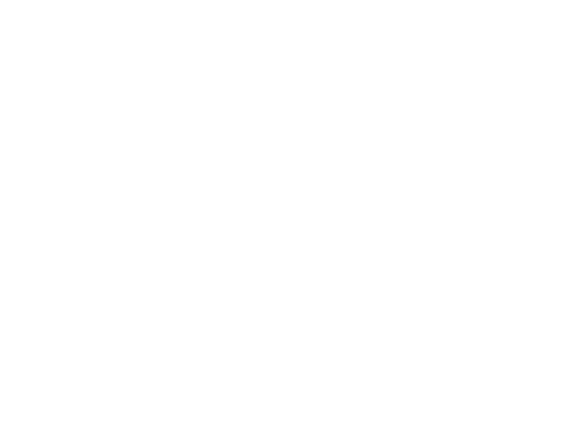

<IPython.core.display.Javascript object>


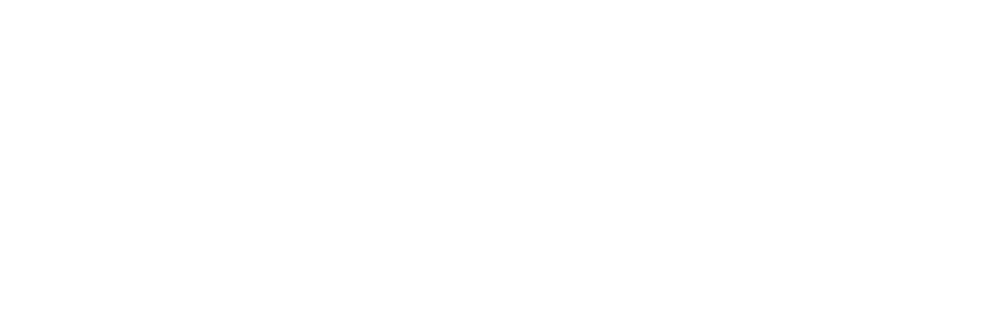

<IPython.core.display.Javascript object>


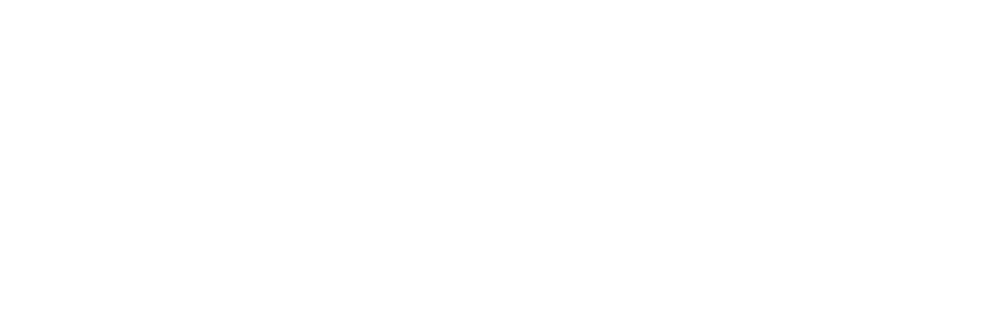

<IPython.core.display.Javascript object>


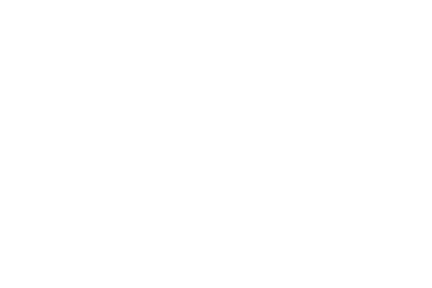

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial2.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


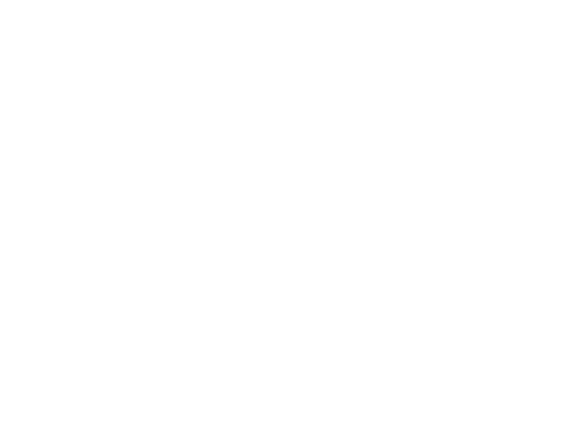

<IPython.core.display.Javascript object>


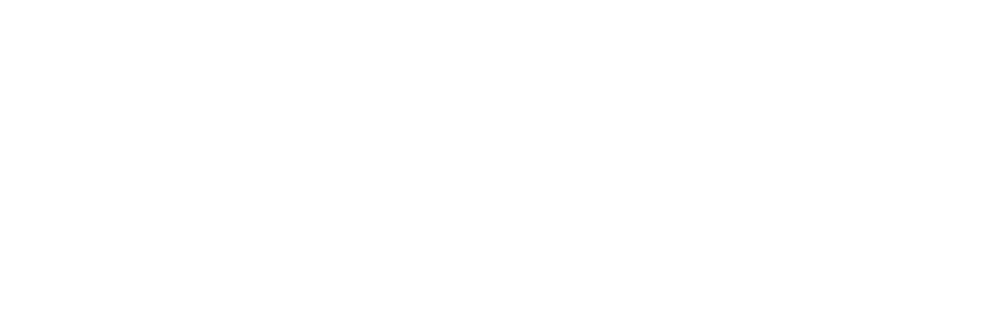

<IPython.core.display.Javascript object>


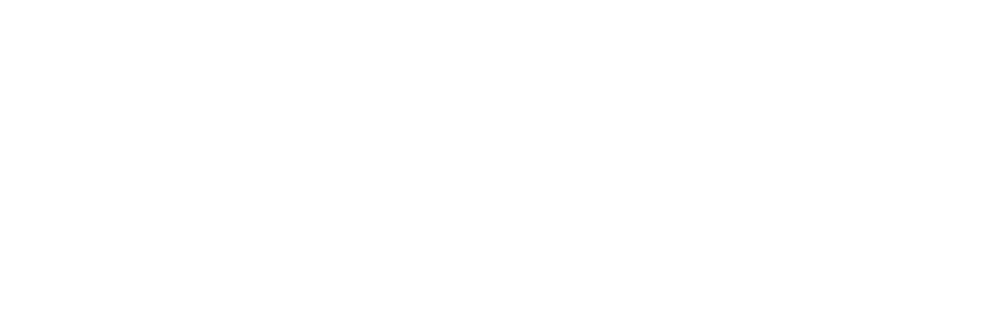

<IPython.core.display.Javascript object>


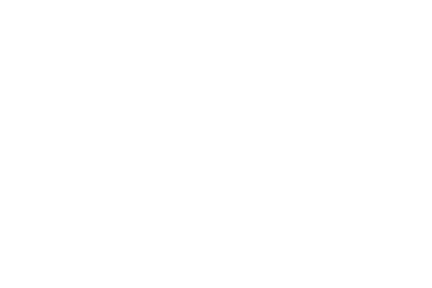

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial3.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


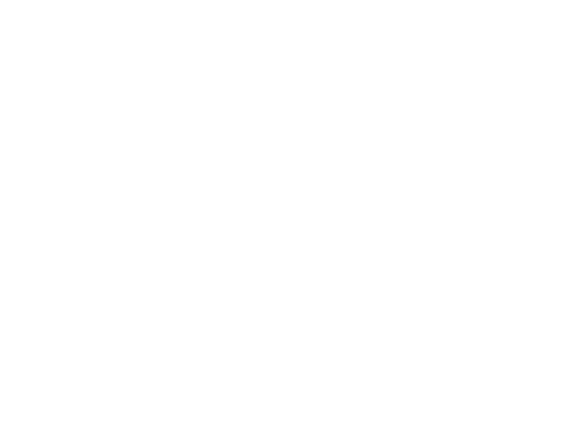

<IPython.core.display.Javascript object>


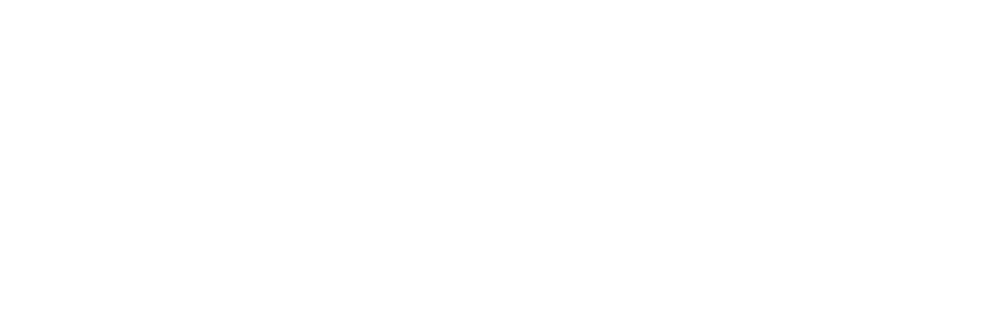

<IPython.core.display.Javascript object>


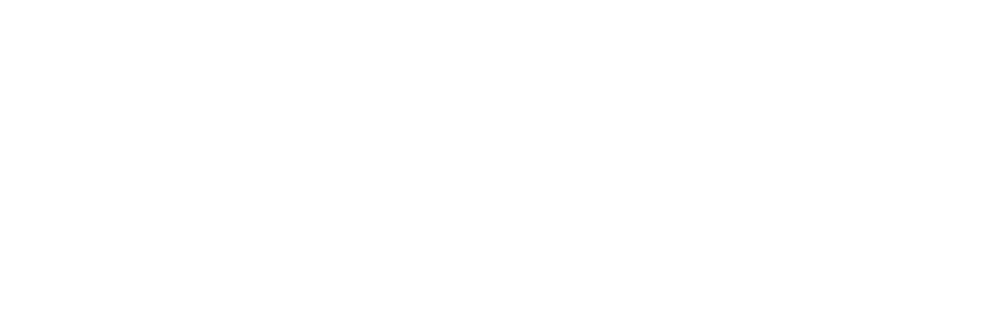

<IPython.core.display.Javascript object>


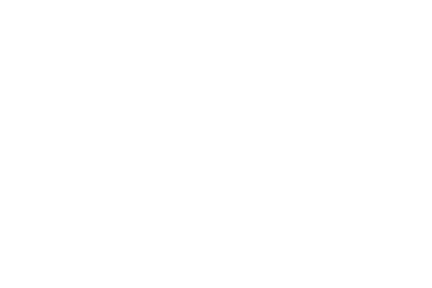

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial4.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


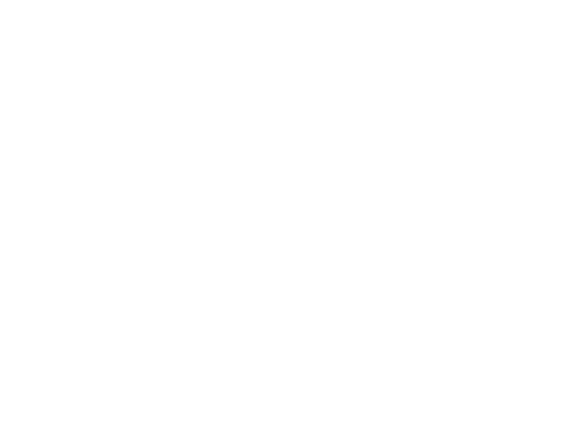

<IPython.core.display.Javascript object>


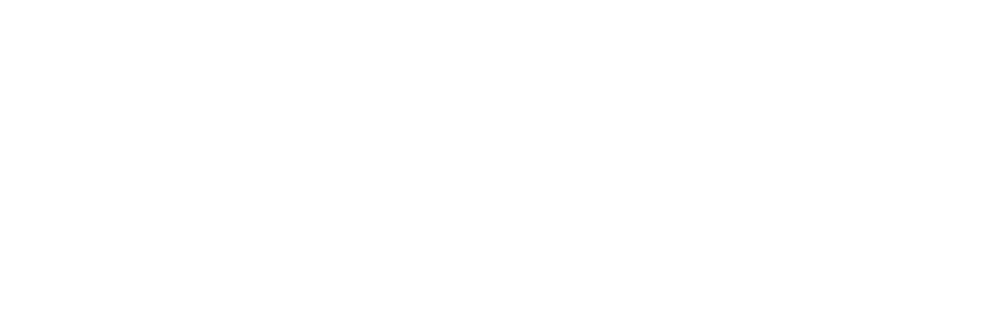

<IPython.core.display.Javascript object>


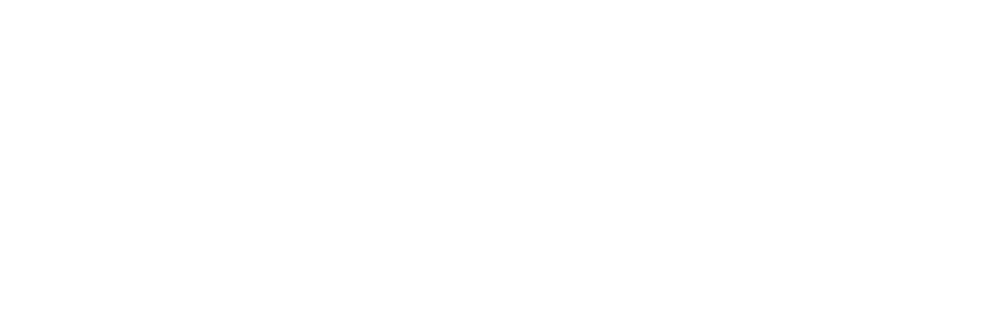

<IPython.core.display.Javascript object>


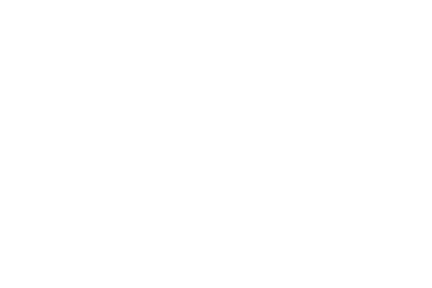

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial5.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


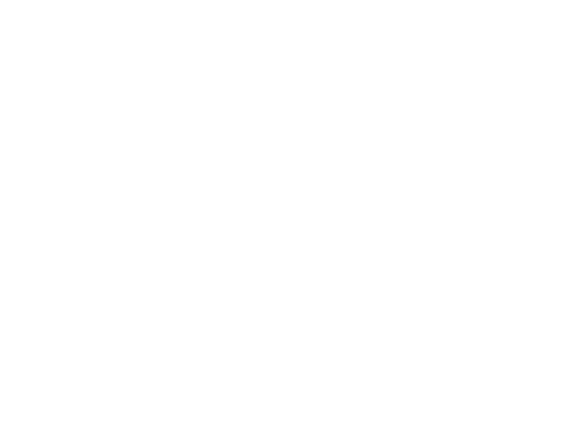

<IPython.core.display.Javascript object>


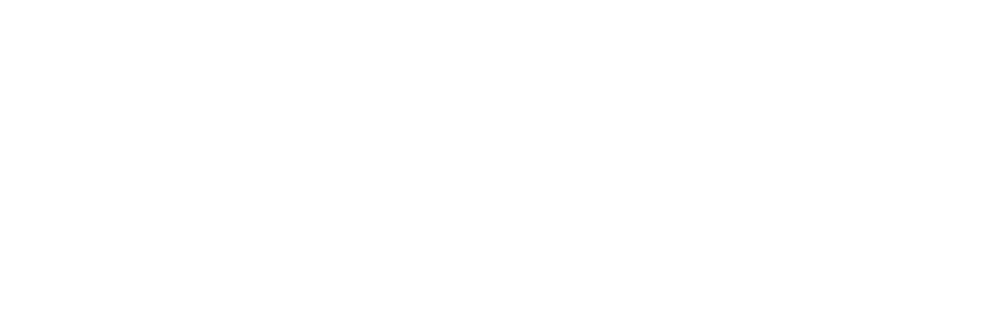

<IPython.core.display.Javascript object>


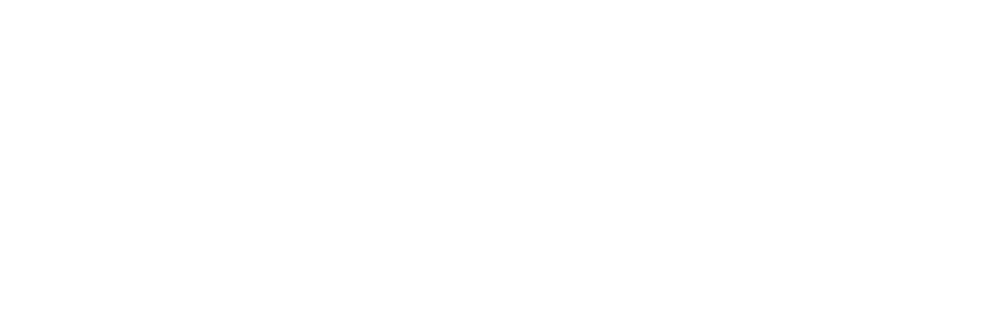

<IPython.core.display.Javascript object>


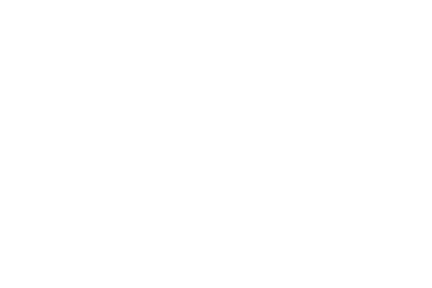

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial6.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


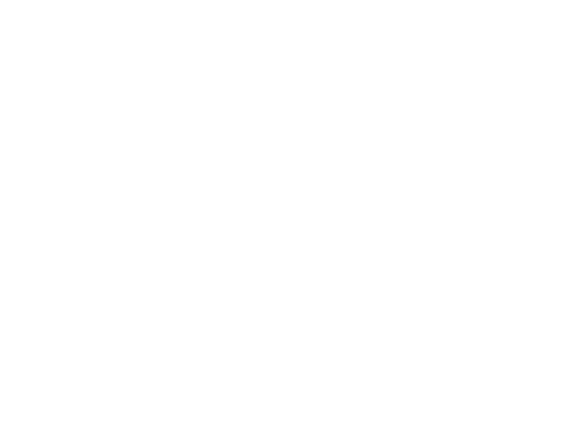

<IPython.core.display.Javascript object>


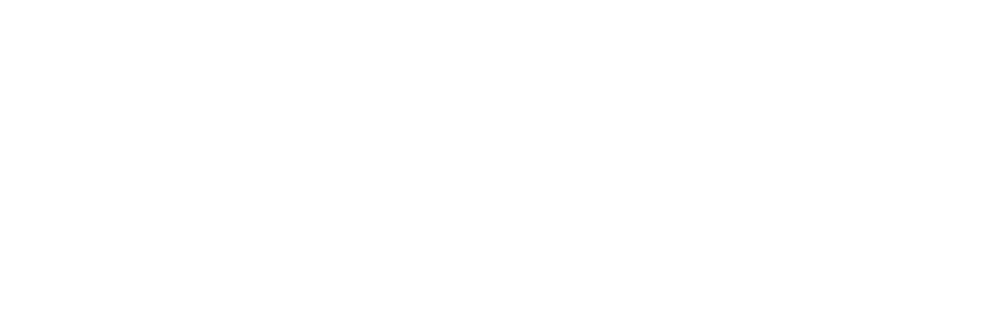

<IPython.core.display.Javascript object>


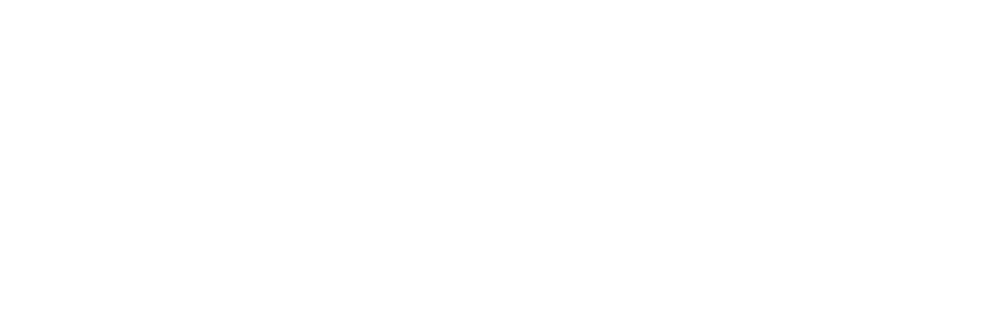

<IPython.core.display.Javascript object>


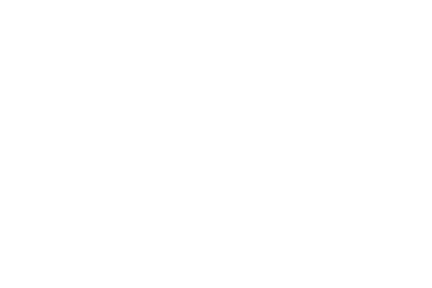

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial7.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


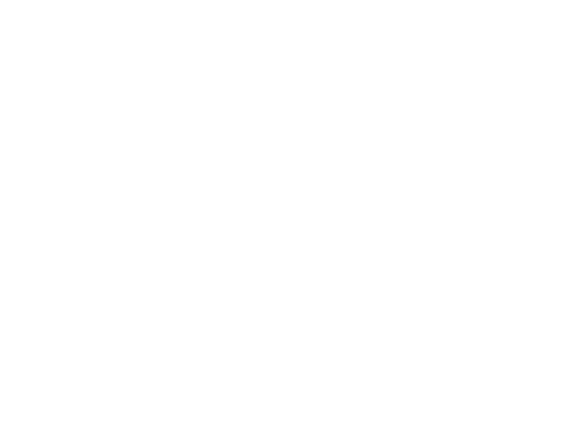

<IPython.core.display.Javascript object>


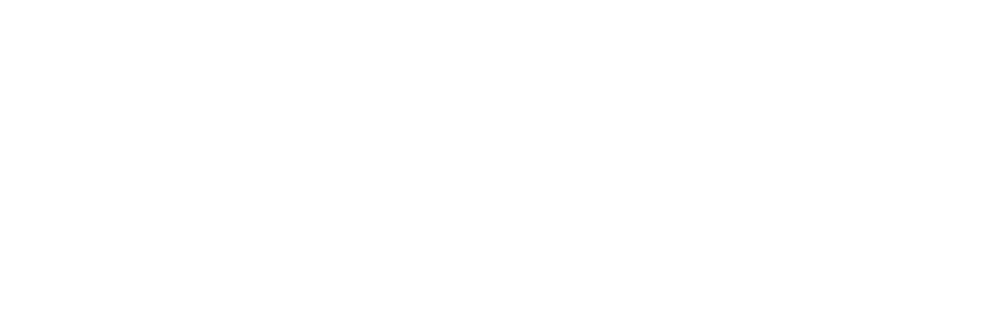

<IPython.core.display.Javascript object>


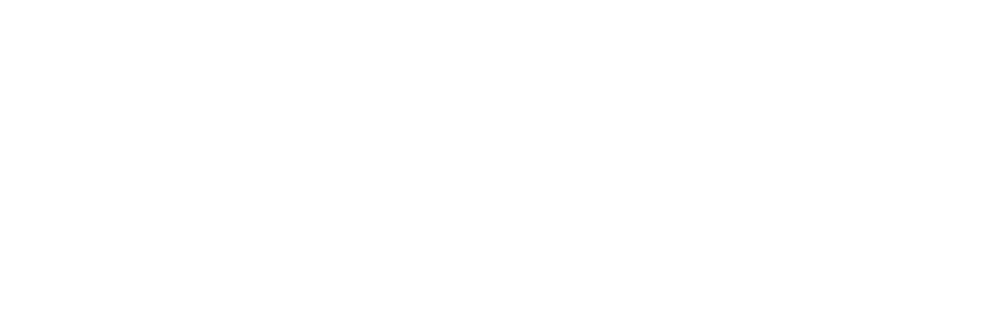

<IPython.core.display.Javascript object>


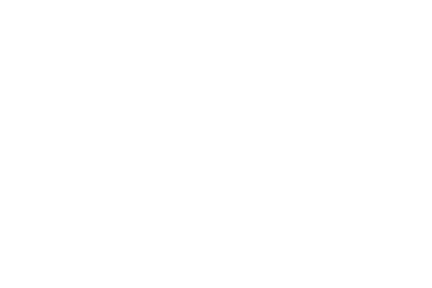

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial8.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


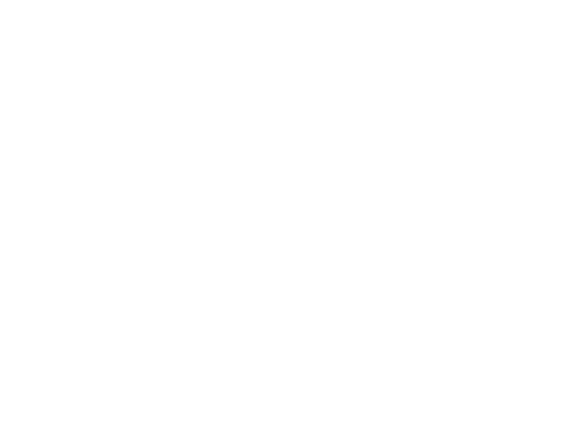

<IPython.core.display.Javascript object>


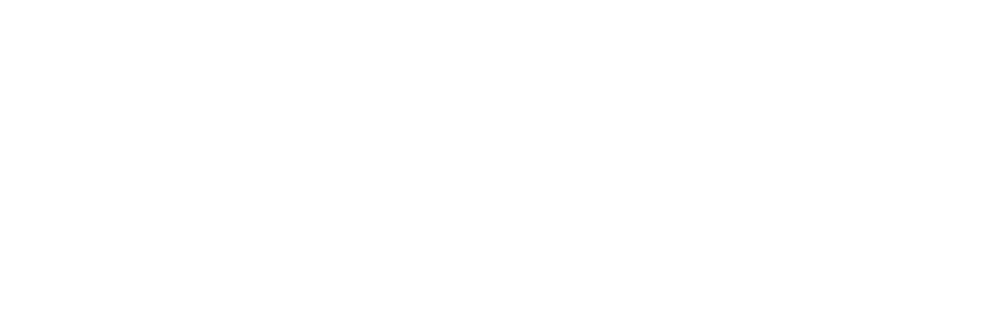

<IPython.core.display.Javascript object>


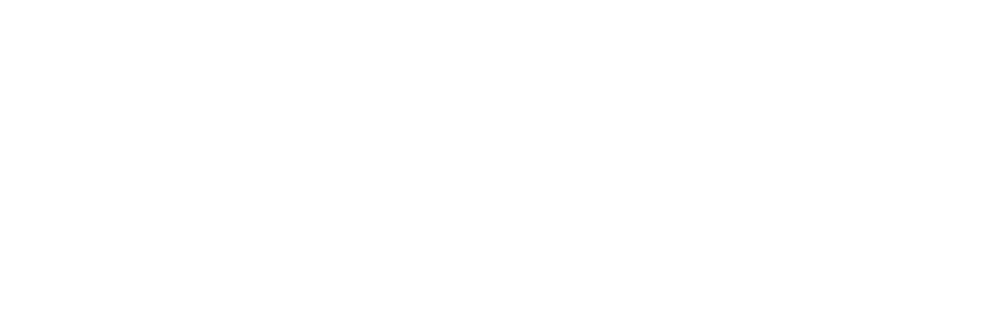

<IPython.core.display.Javascript object>


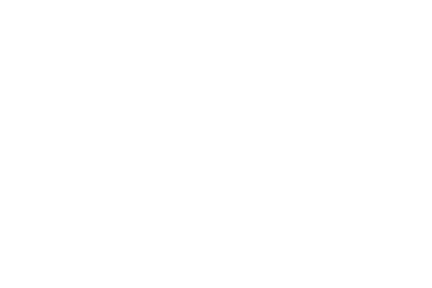

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial9.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


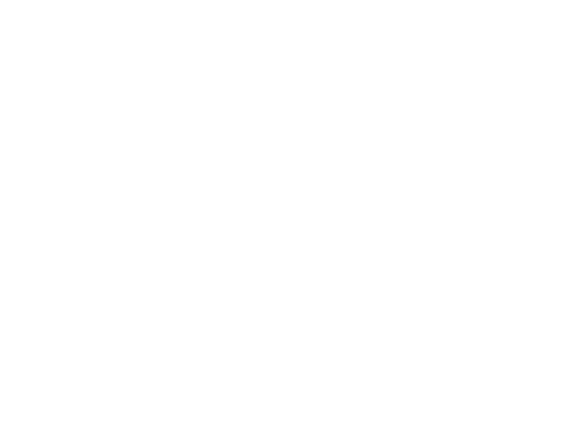

<IPython.core.display.Javascript object>


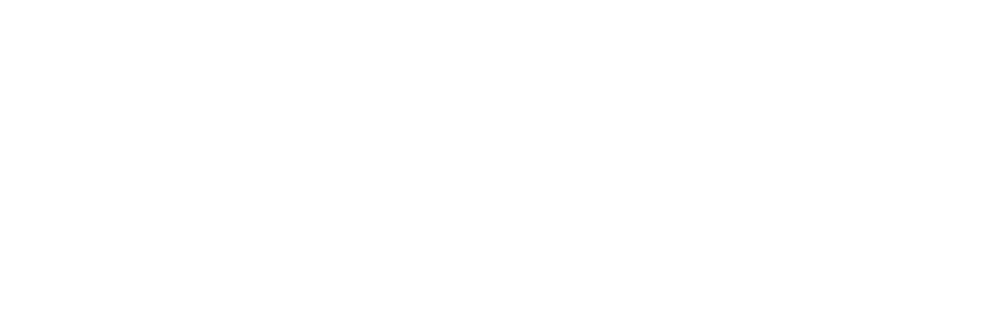

<IPython.core.display.Javascript object>


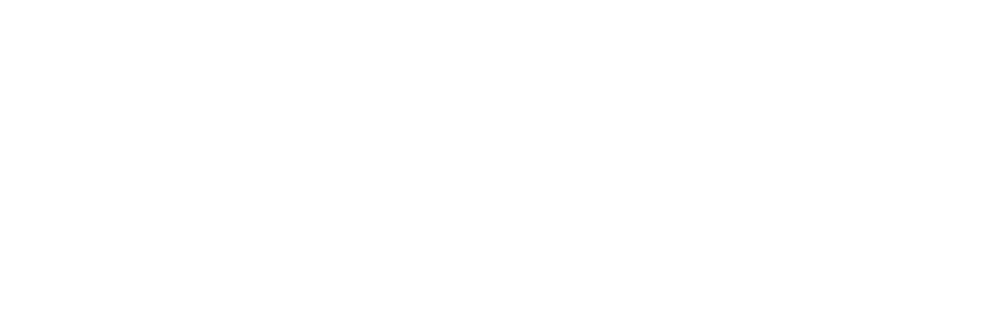

<IPython.core.display.Javascript object>


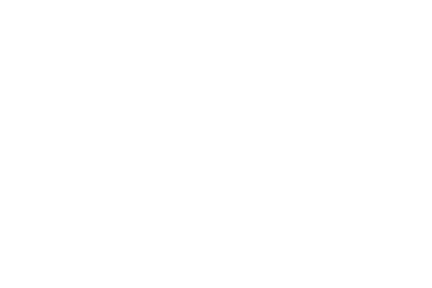

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial10.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


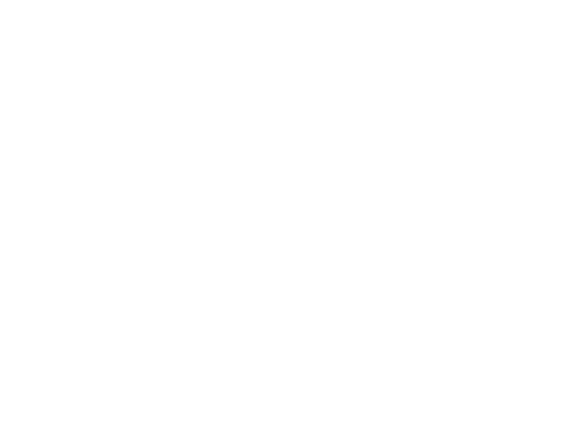

<IPython.core.display.Javascript object>


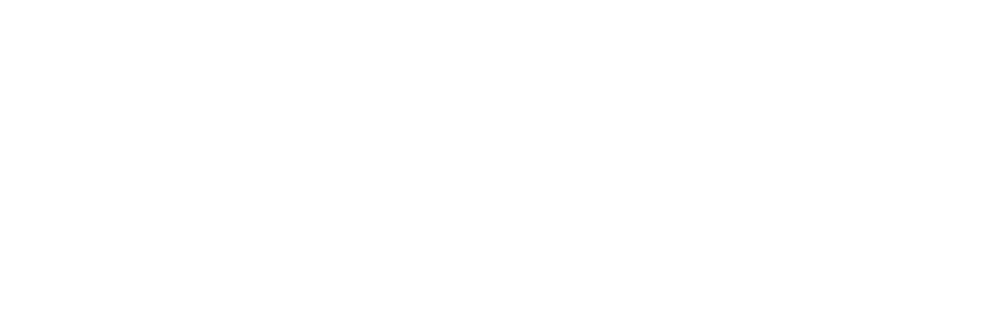

<IPython.core.display.Javascript object>


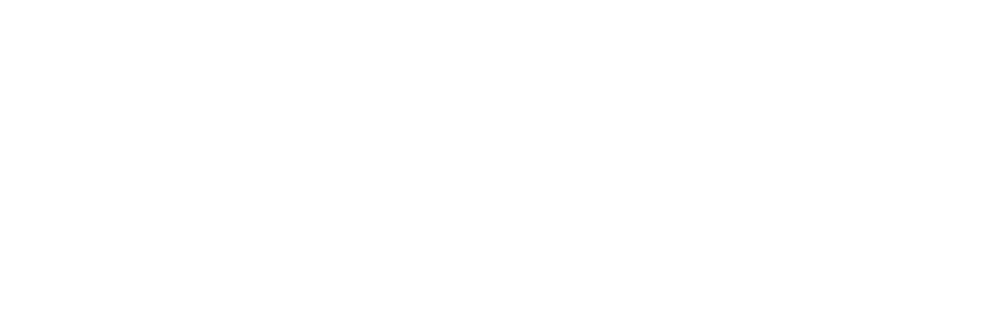

<IPython.core.display.Javascript object>


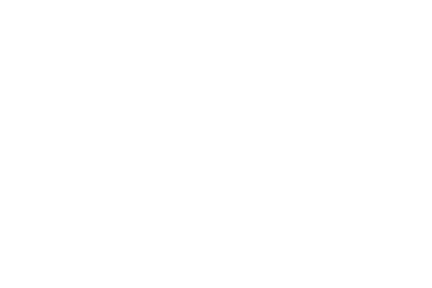

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial11.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


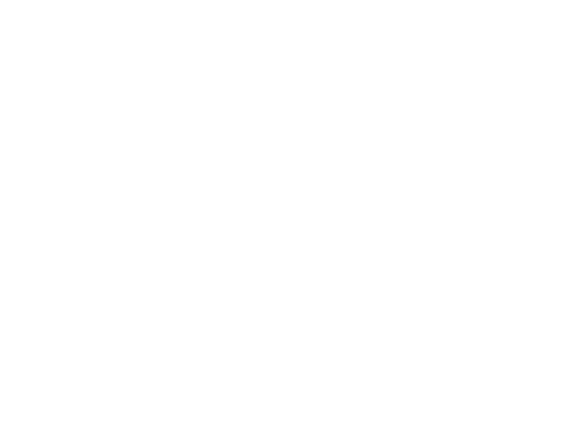

<IPython.core.display.Javascript object>


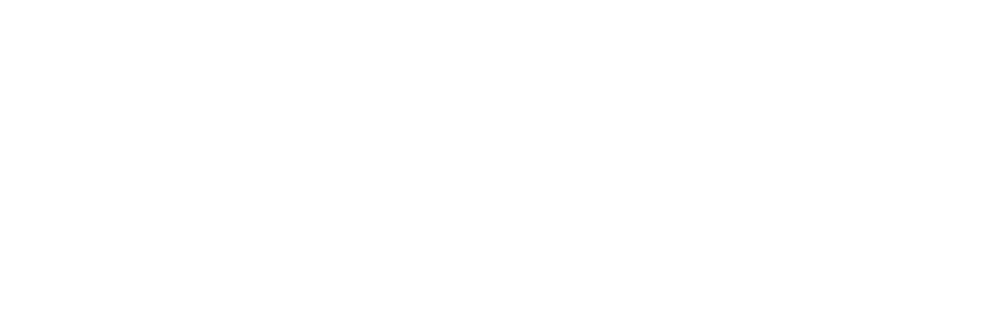

<IPython.core.display.Javascript object>


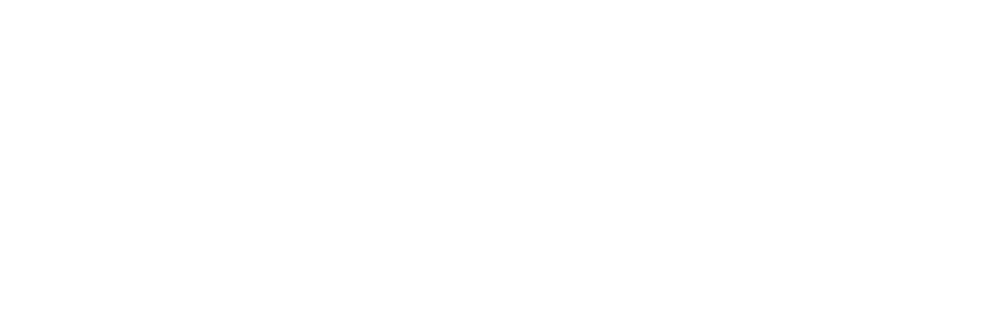

<IPython.core.display.Javascript object>


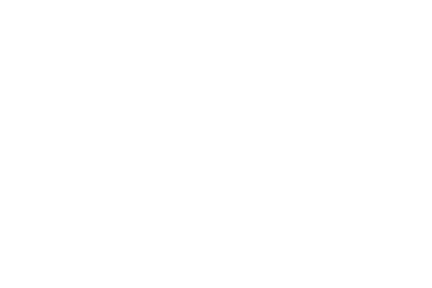

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial12.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


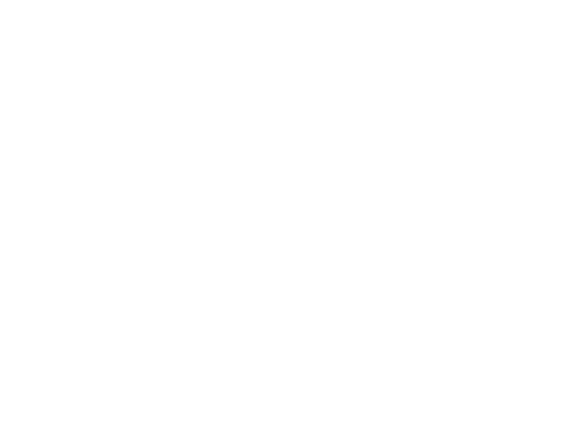

<IPython.core.display.Javascript object>


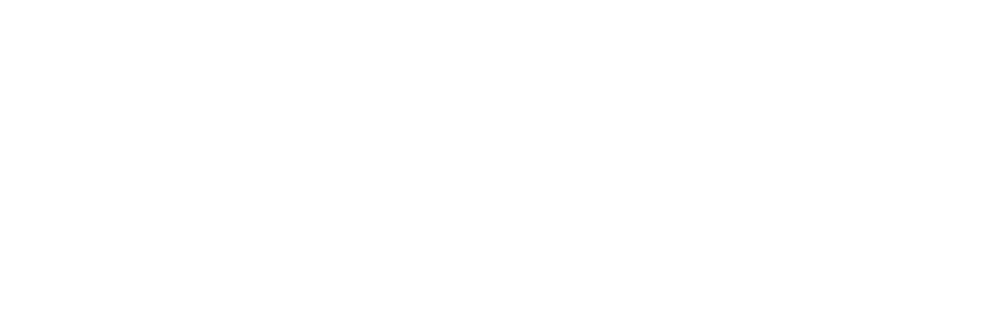

<IPython.core.display.Javascript object>


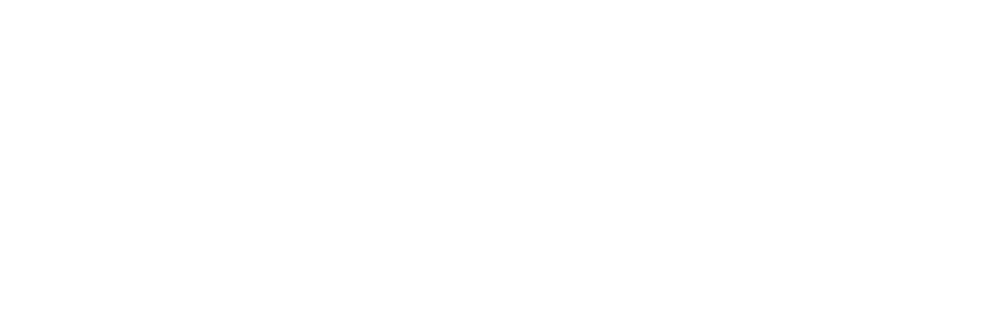

<IPython.core.display.Javascript object>


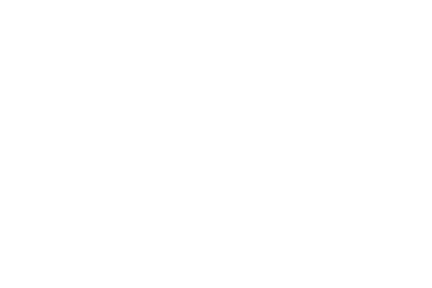

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial13.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


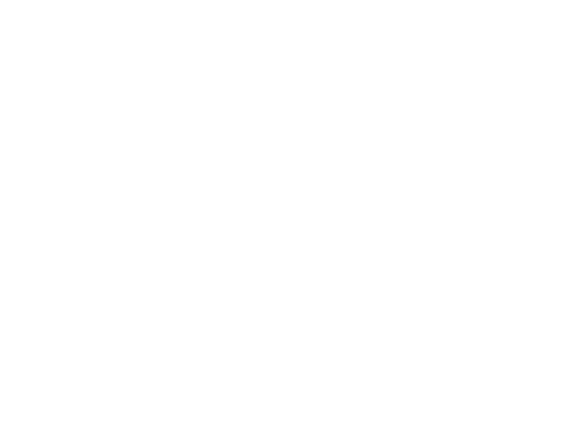

<IPython.core.display.Javascript object>


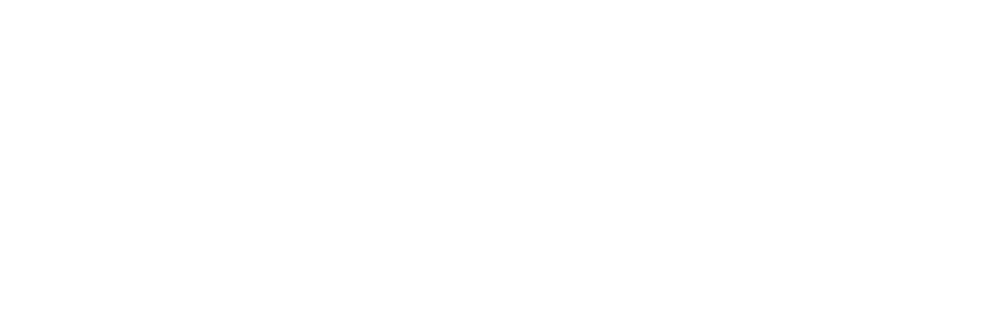

<IPython.core.display.Javascript object>


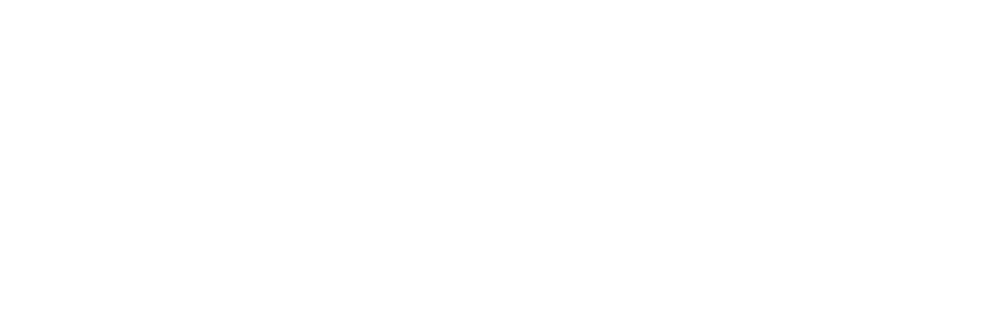

<IPython.core.display.Javascript object>


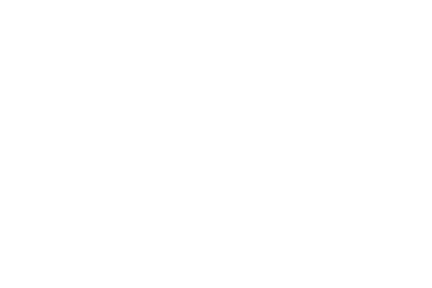

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial14.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


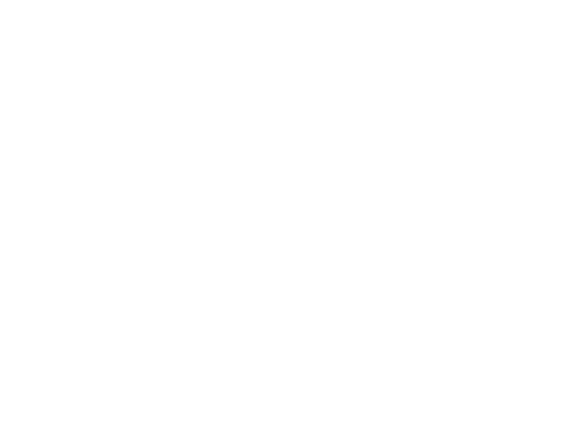

<IPython.core.display.Javascript object>


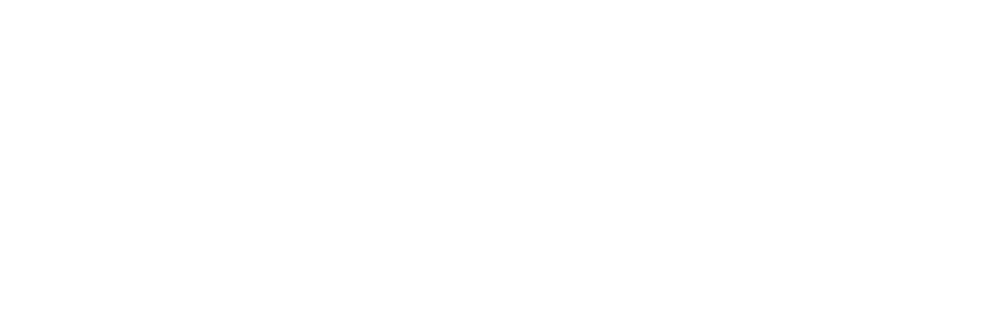

<IPython.core.display.Javascript object>


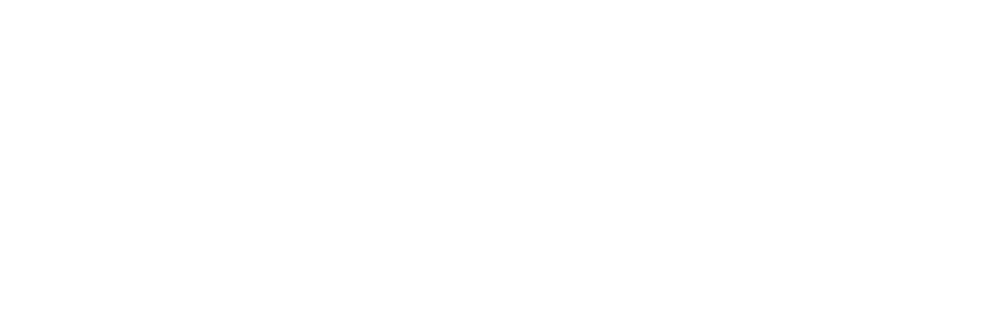

<IPython.core.display.Javascript object>


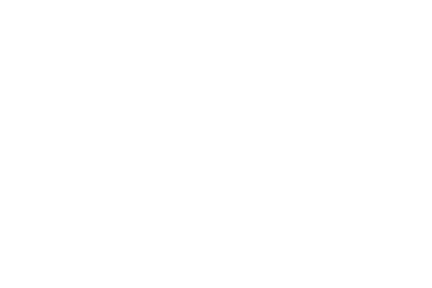

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial15.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


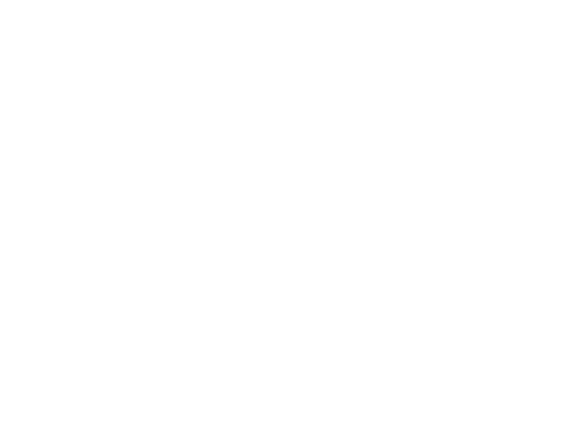

<IPython.core.display.Javascript object>


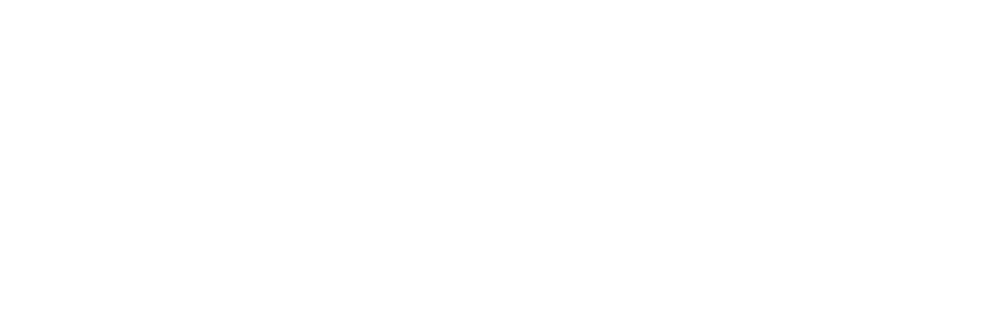

<IPython.core.display.Javascript object>


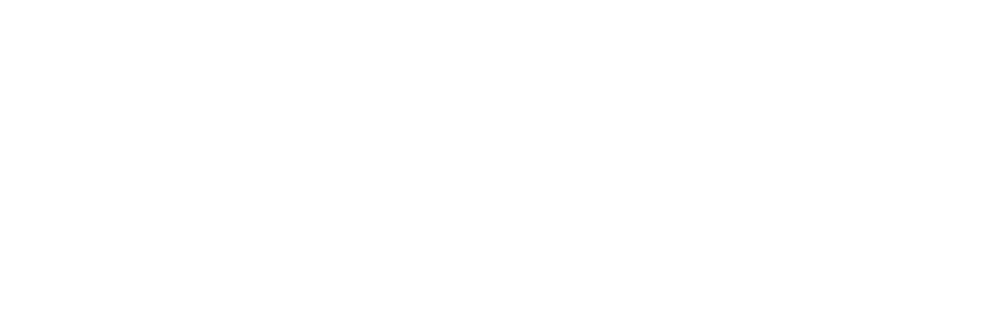

<IPython.core.display.Javascript object>


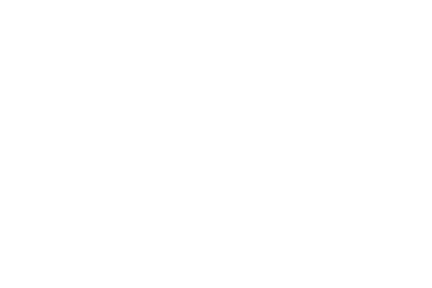

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial1.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


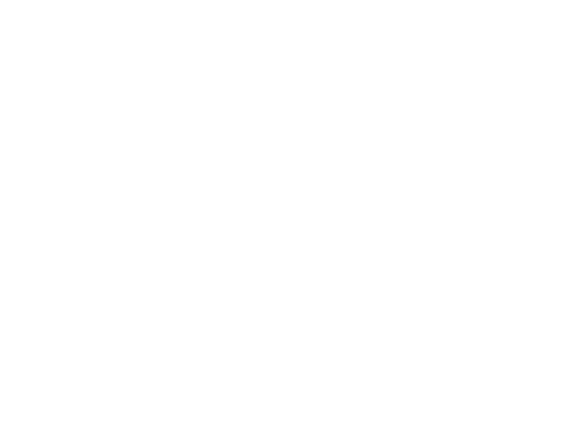

<IPython.core.display.Javascript object>


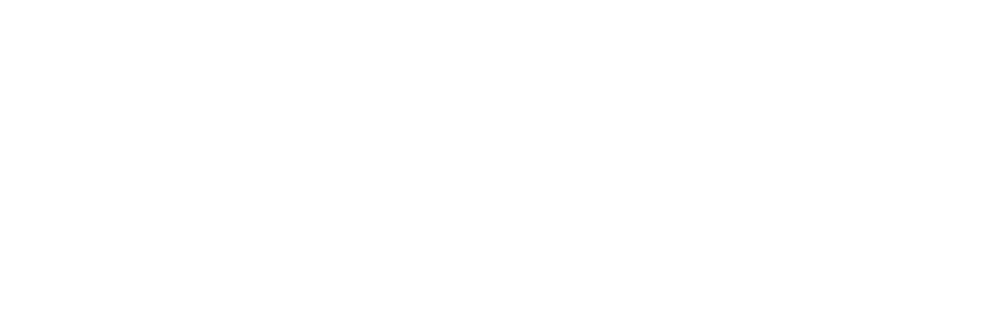

<IPython.core.display.Javascript object>


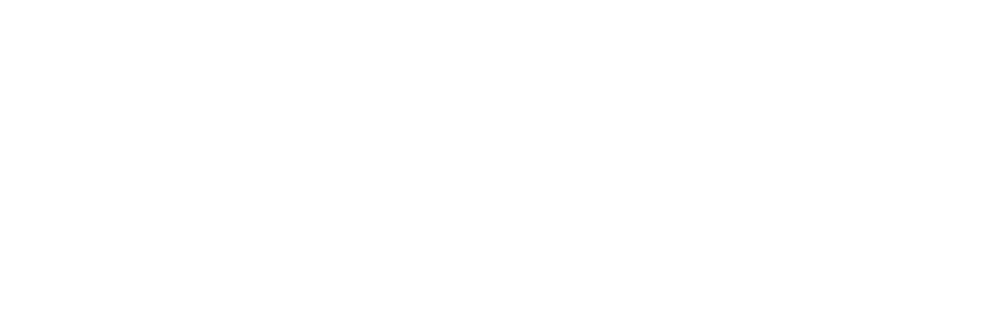

<IPython.core.display.Javascript object>


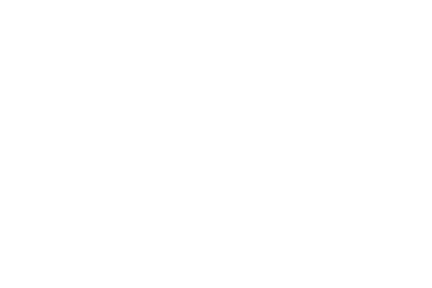

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial2.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


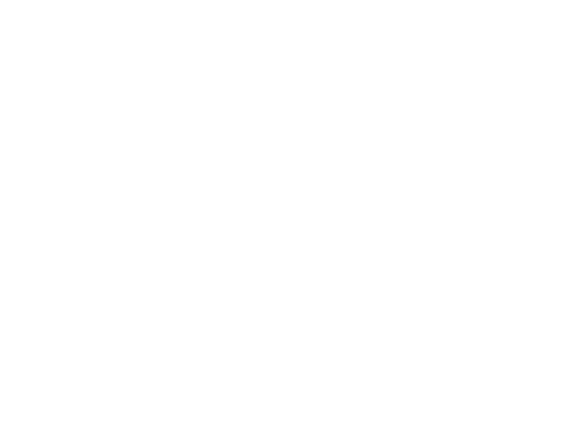

<IPython.core.display.Javascript object>


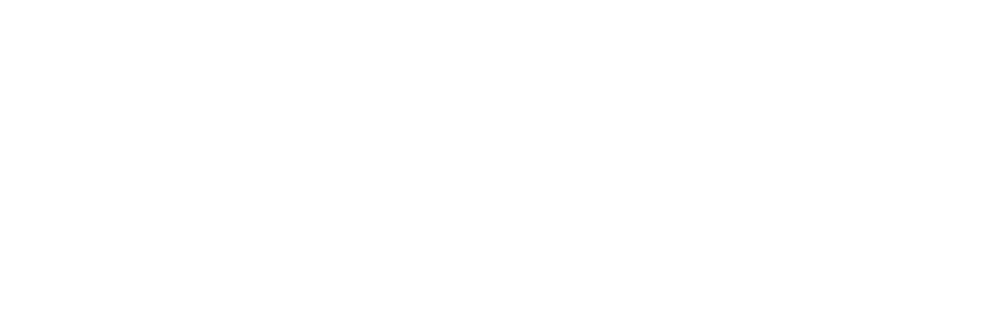

<IPython.core.display.Javascript object>


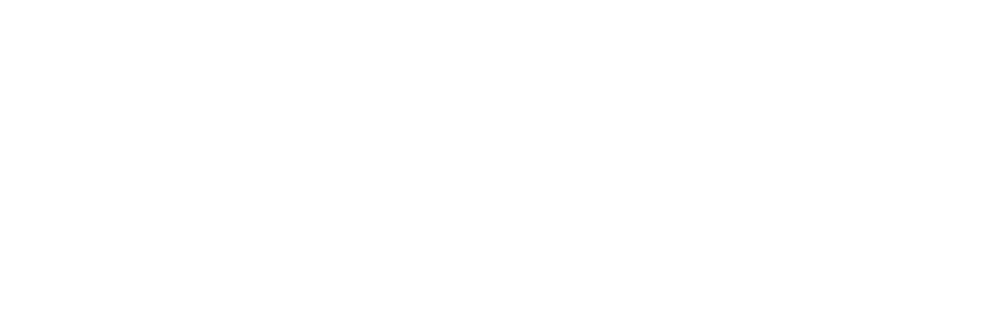

<IPython.core.display.Javascript object>


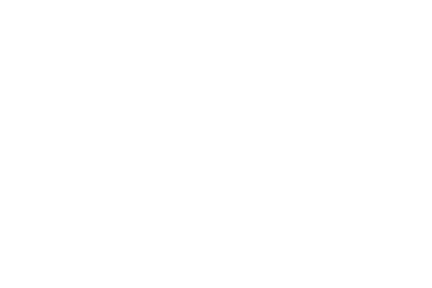

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial3.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


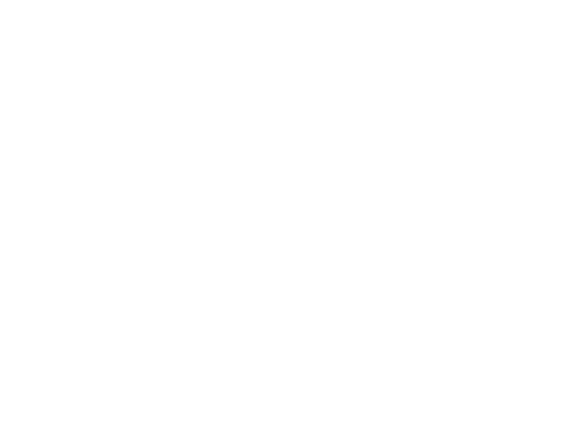

<IPython.core.display.Javascript object>


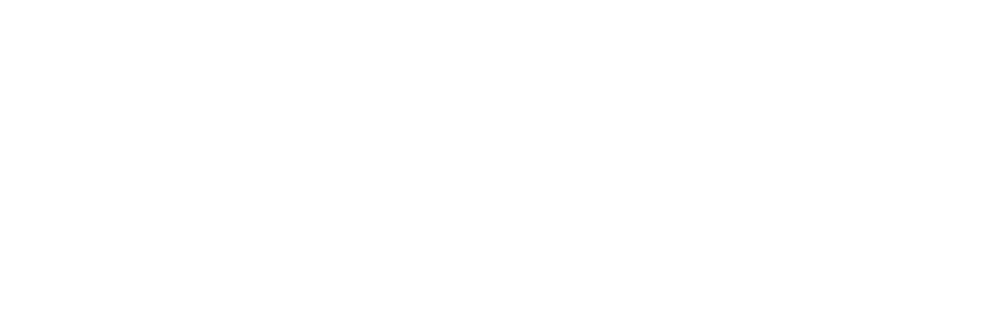

<IPython.core.display.Javascript object>


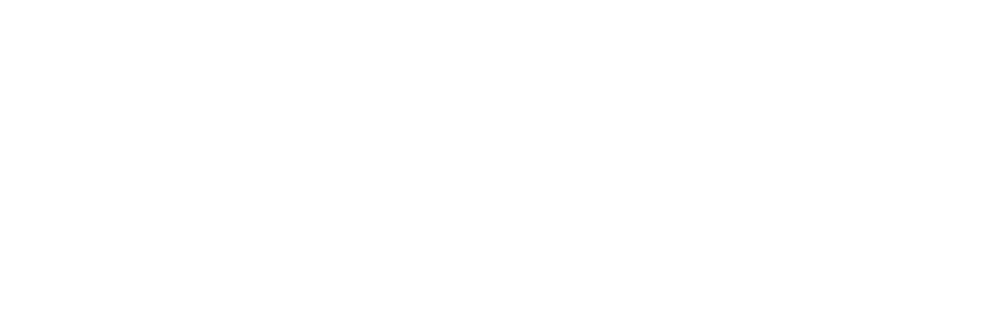

<IPython.core.display.Javascript object>


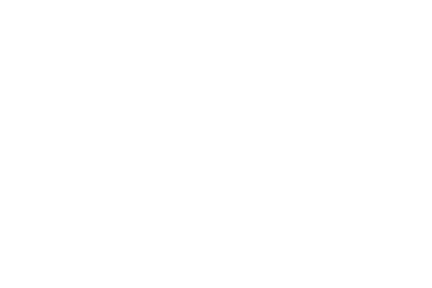

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial4.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


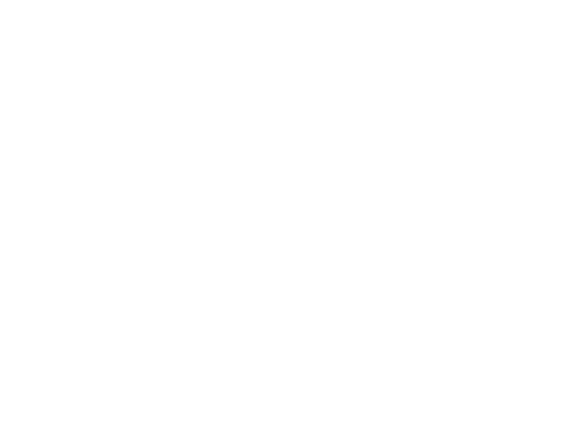

<IPython.core.display.Javascript object>


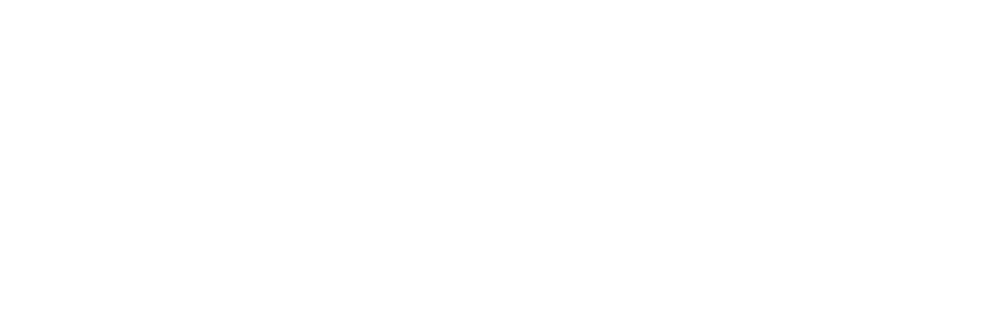

<IPython.core.display.Javascript object>


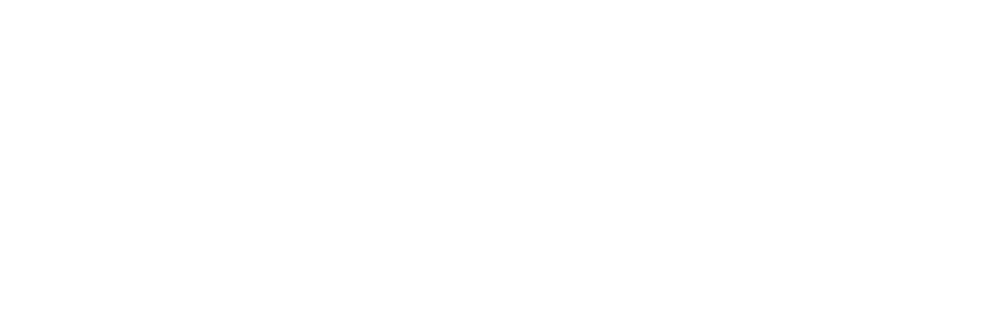

<IPython.core.display.Javascript object>


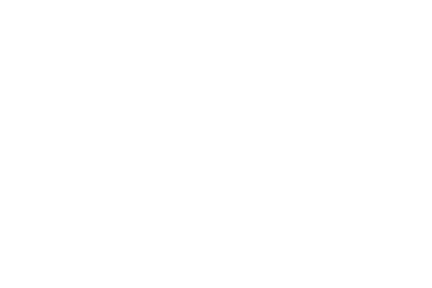

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial5.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


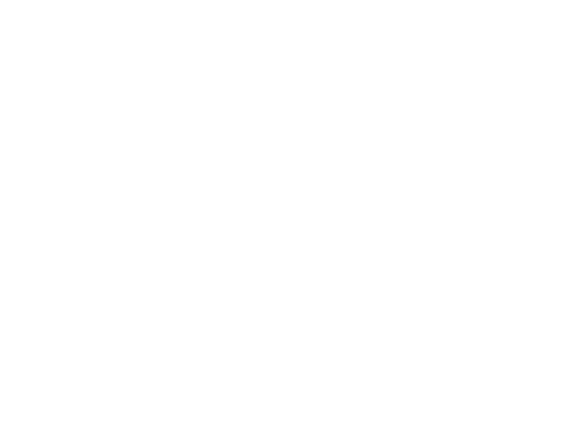

<IPython.core.display.Javascript object>


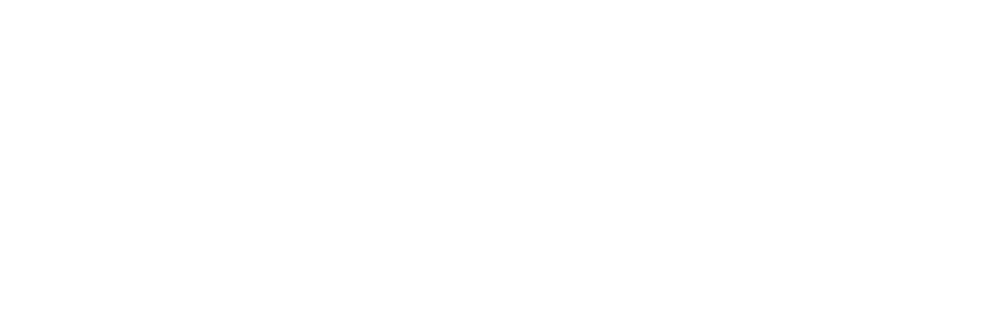

<IPython.core.display.Javascript object>


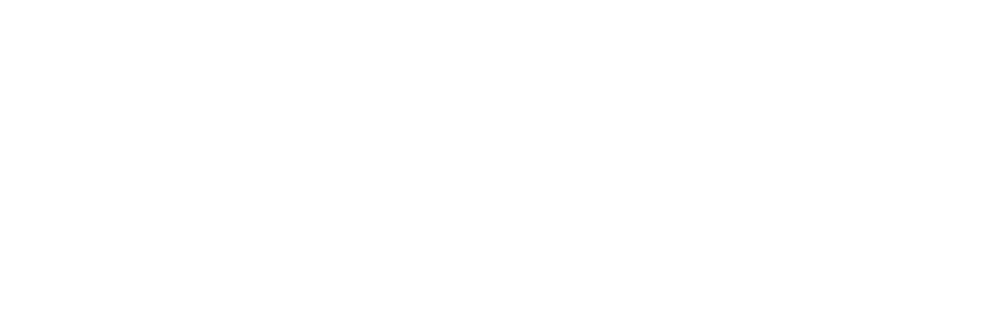

<IPython.core.display.Javascript object>


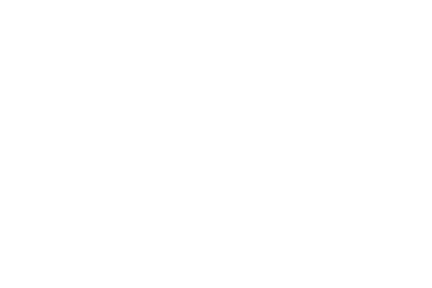

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial6.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


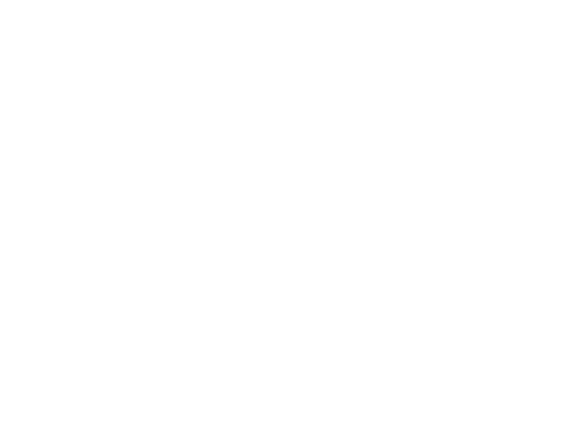

<IPython.core.display.Javascript object>


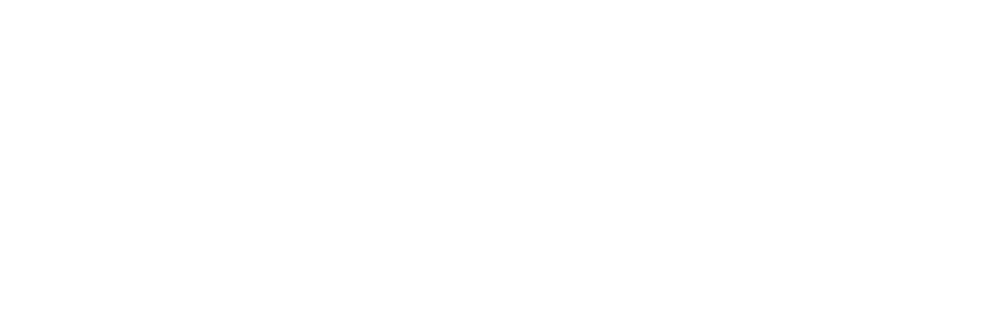

<IPython.core.display.Javascript object>


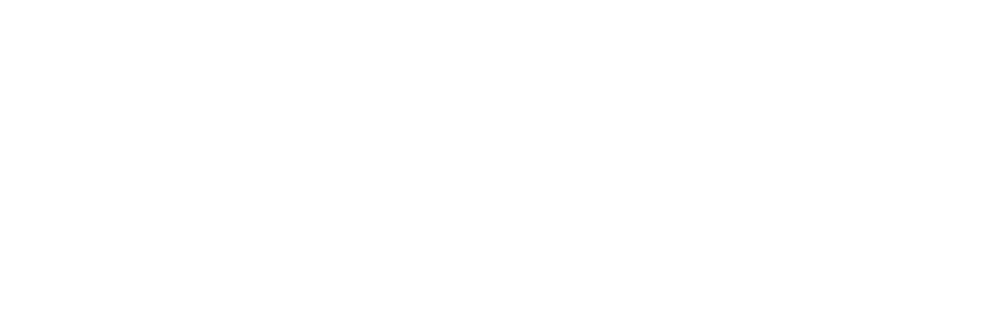

<IPython.core.display.Javascript object>


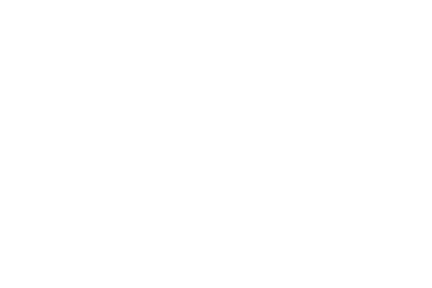

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial7.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


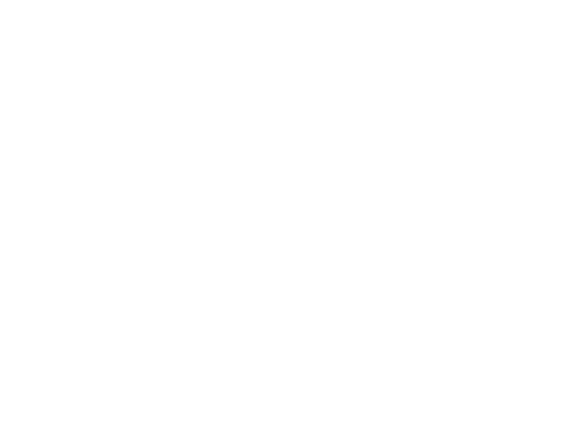

<IPython.core.display.Javascript object>


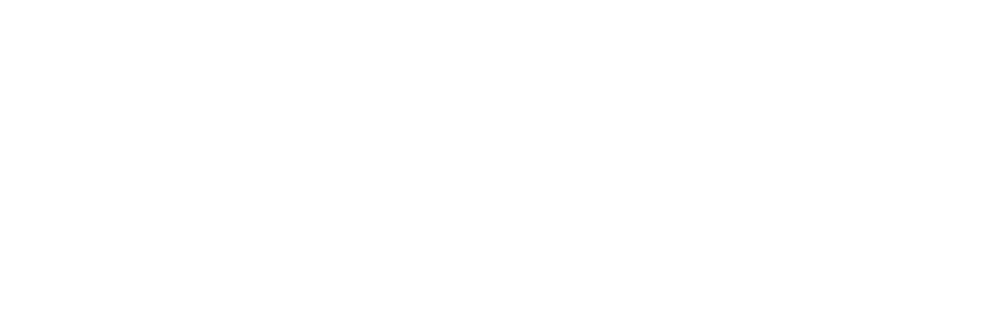

<IPython.core.display.Javascript object>


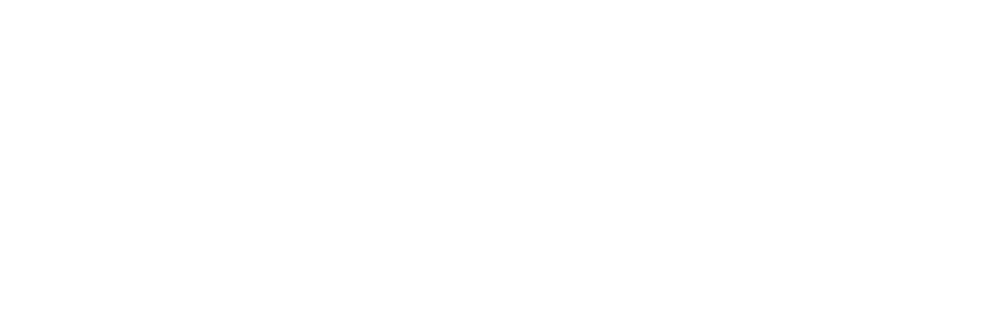

<IPython.core.display.Javascript object>


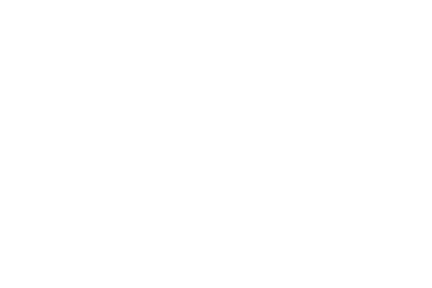

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial8.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


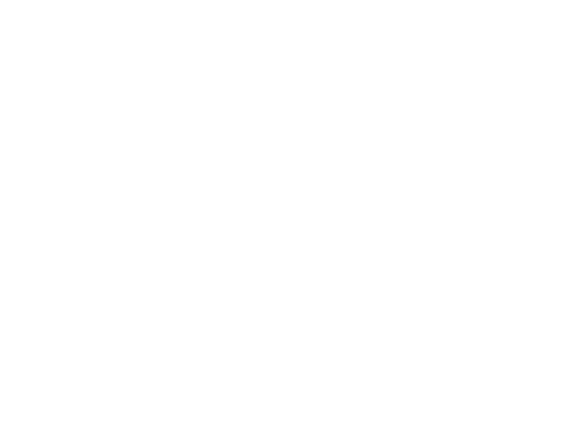

<IPython.core.display.Javascript object>


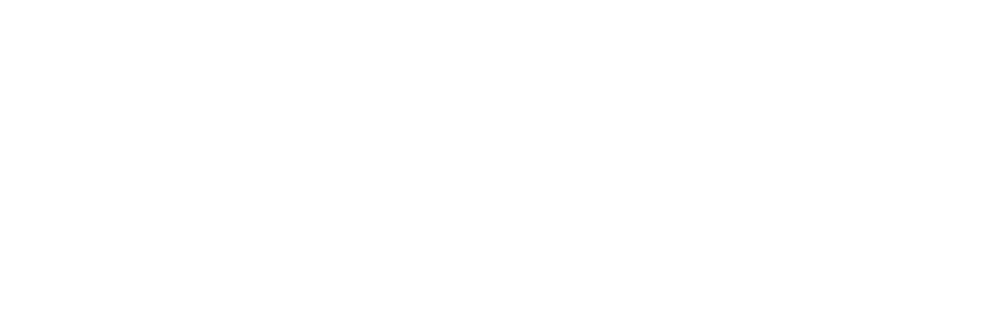

<IPython.core.display.Javascript object>


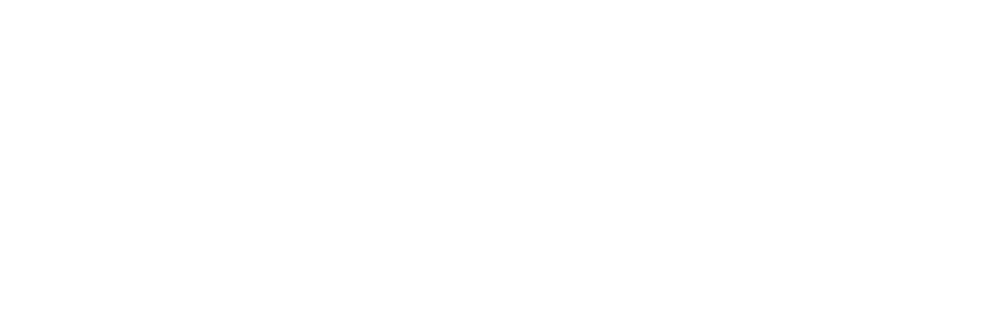

<IPython.core.display.Javascript object>


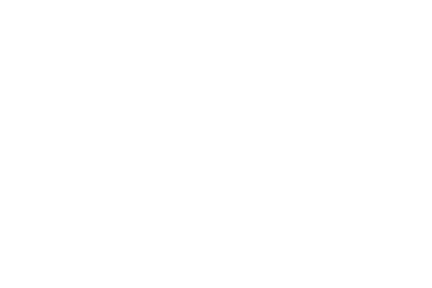

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial9.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


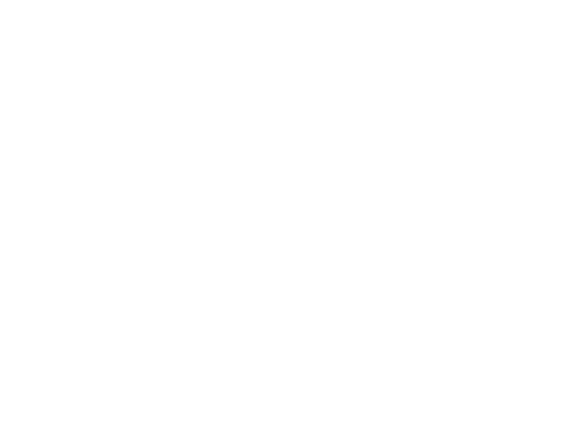

<IPython.core.display.Javascript object>


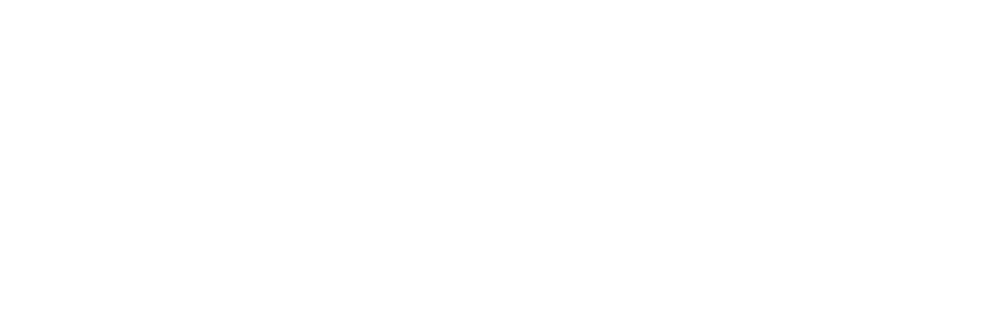

<IPython.core.display.Javascript object>


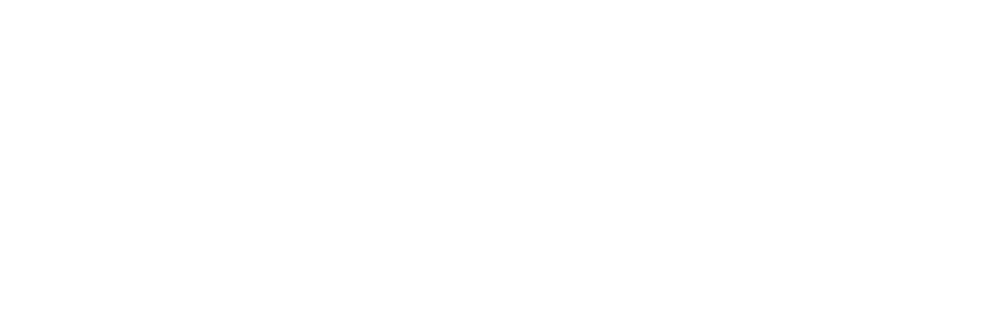

<IPython.core.display.Javascript object>


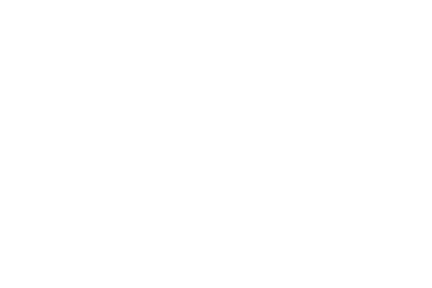

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial10.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


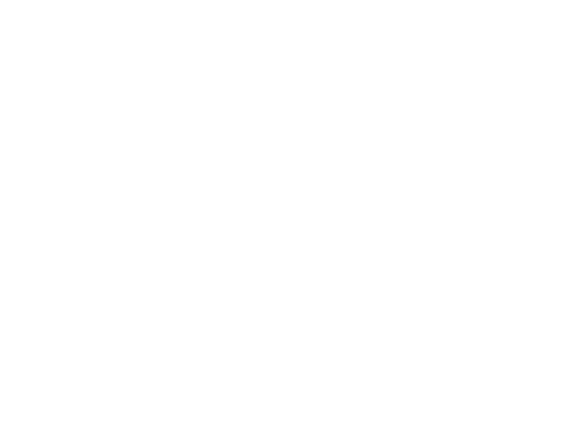

<IPython.core.display.Javascript object>


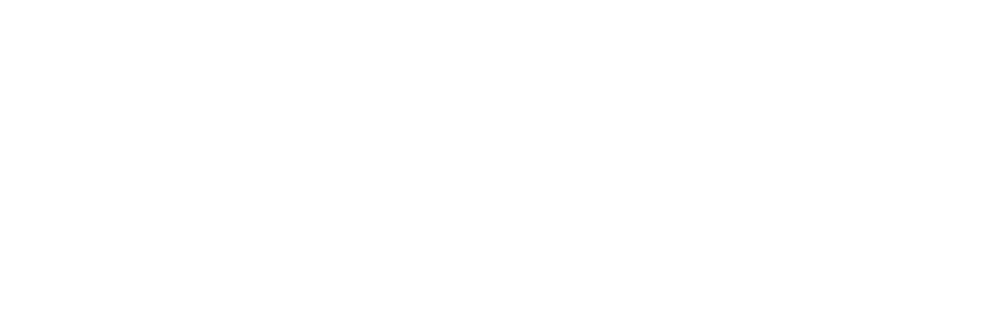

<IPython.core.display.Javascript object>


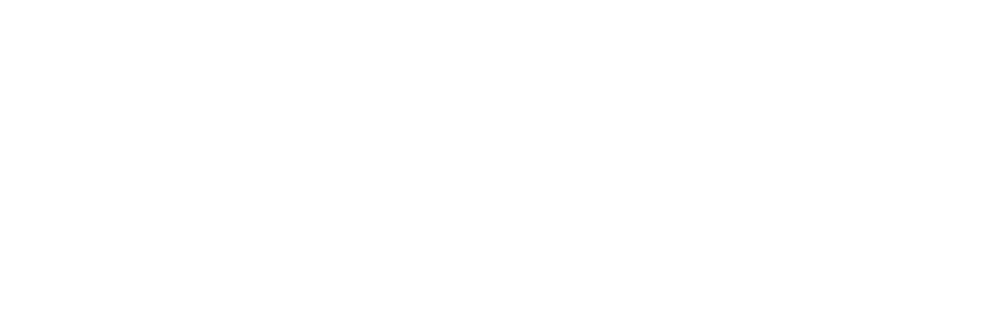

<IPython.core.display.Javascript object>


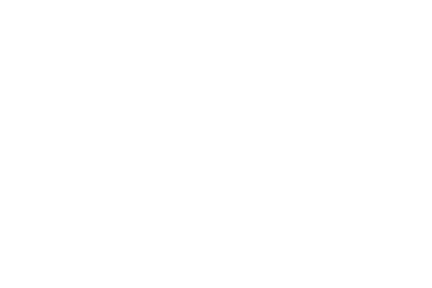

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial11.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


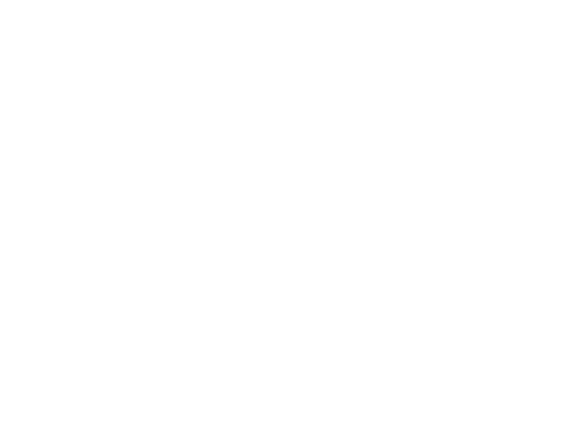

<IPython.core.display.Javascript object>


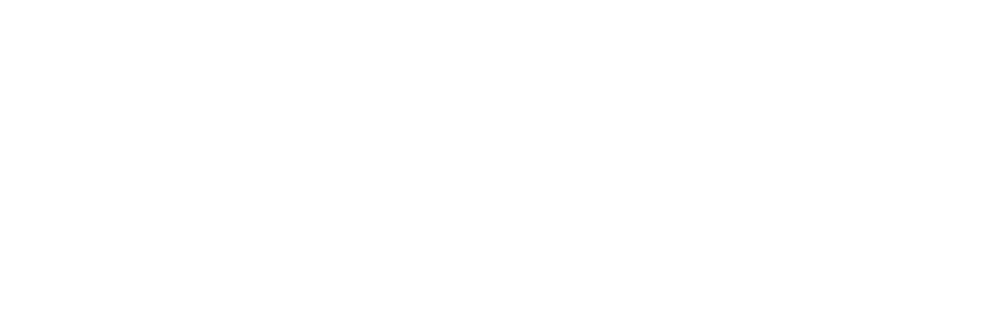

<IPython.core.display.Javascript object>


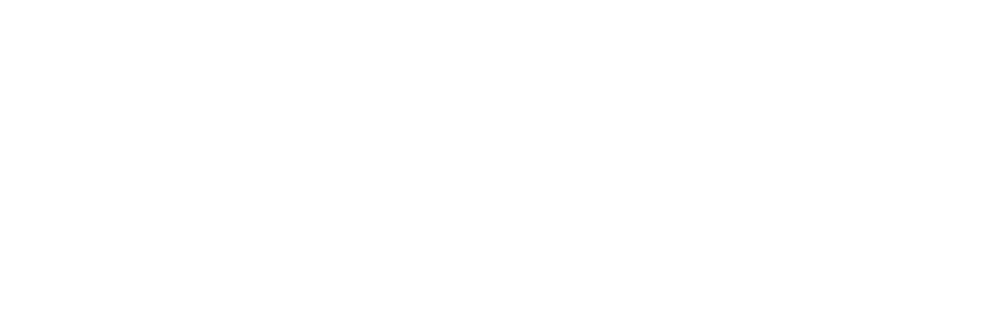

<IPython.core.display.Javascript object>


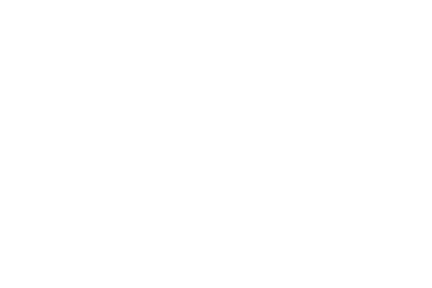

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial12.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


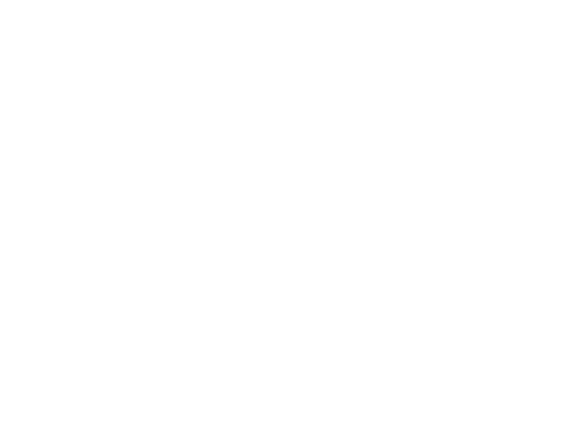

<IPython.core.display.Javascript object>


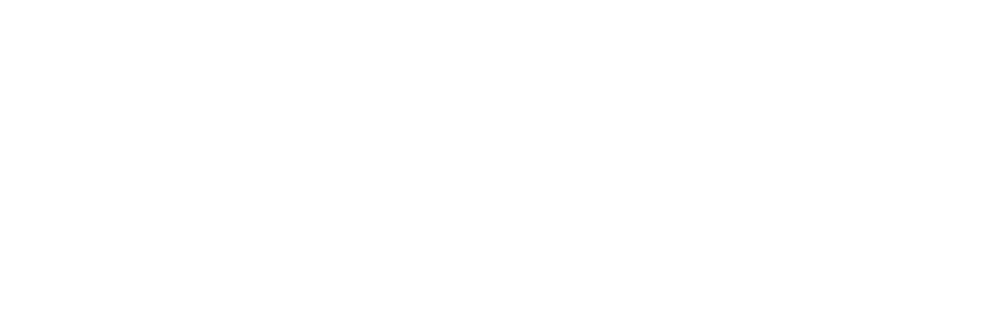

<IPython.core.display.Javascript object>


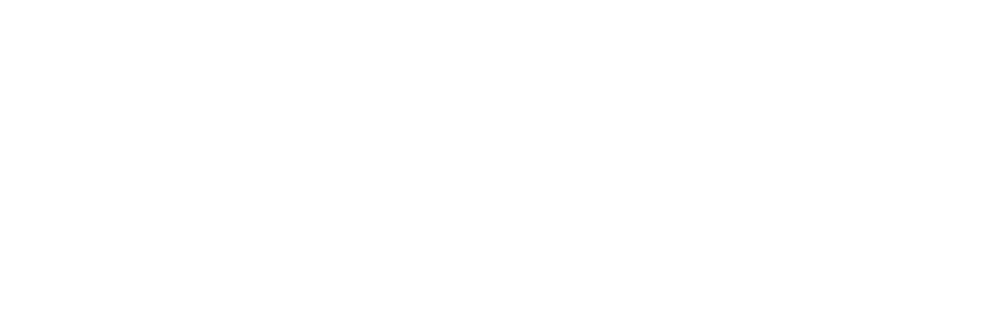

<IPython.core.display.Javascript object>


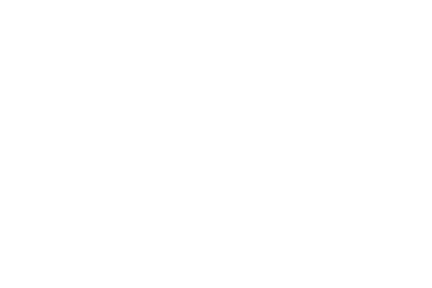

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial13.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


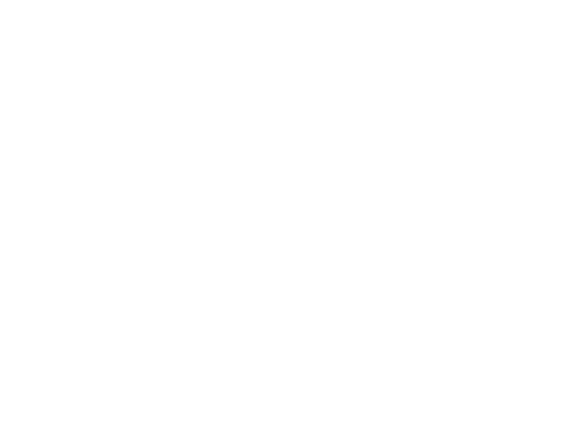

<IPython.core.display.Javascript object>


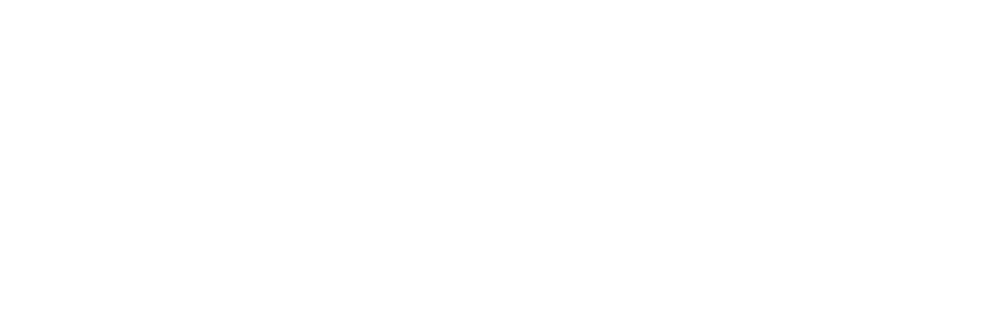

<IPython.core.display.Javascript object>


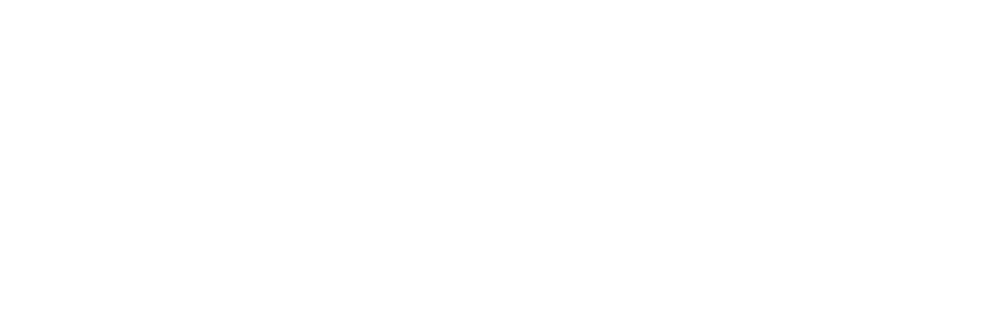

<IPython.core.display.Javascript object>


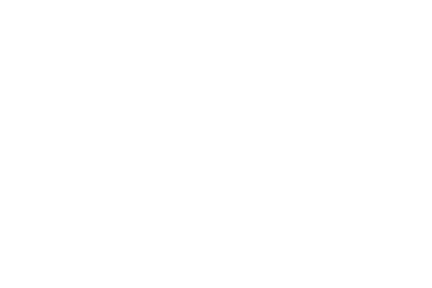

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial14.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


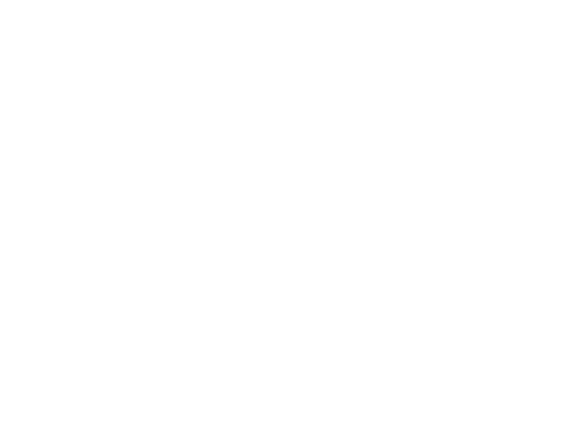

<IPython.core.display.Javascript object>


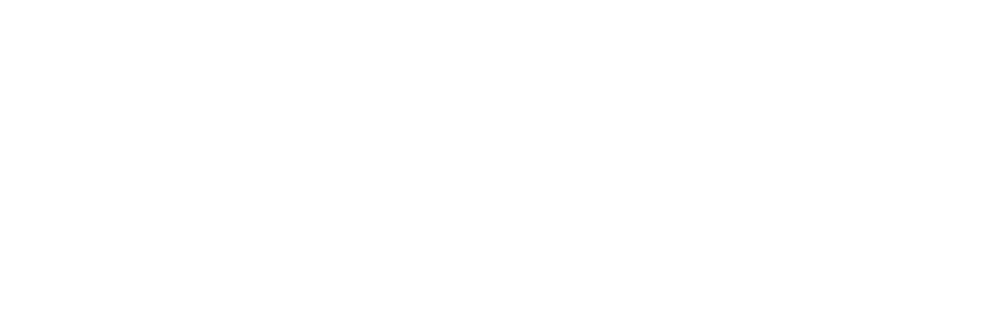

<IPython.core.display.Javascript object>


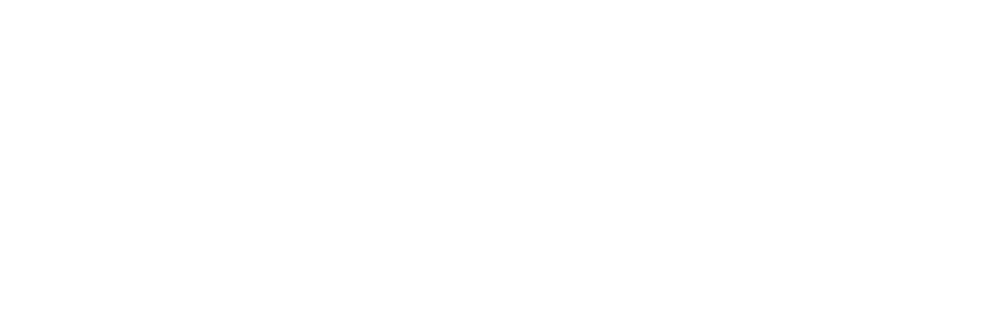

<IPython.core.display.Javascript object>


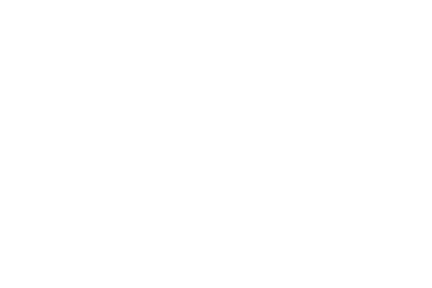

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial15.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


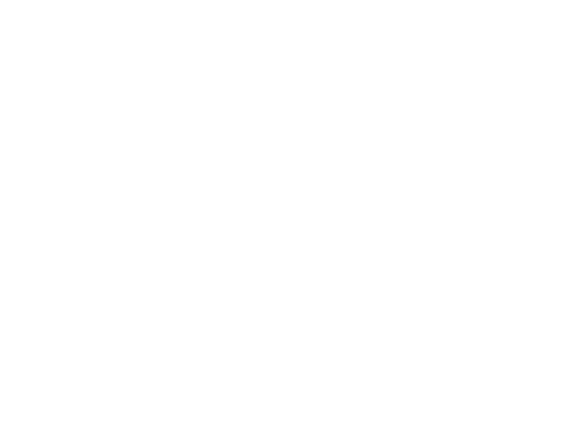

<IPython.core.display.Javascript object>


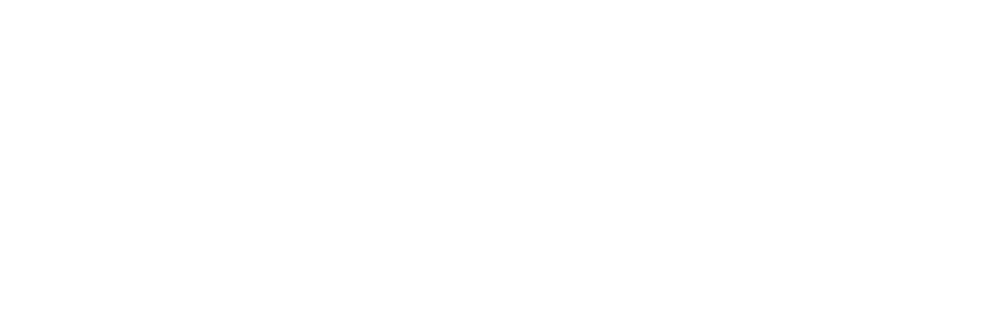

<IPython.core.display.Javascript object>


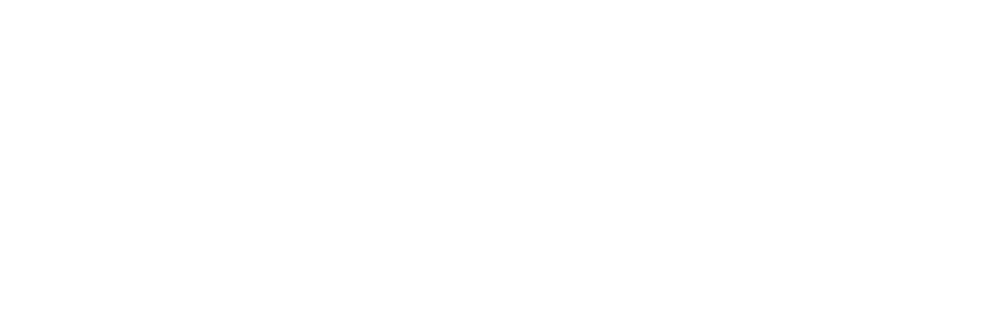

<IPython.core.display.Javascript object>


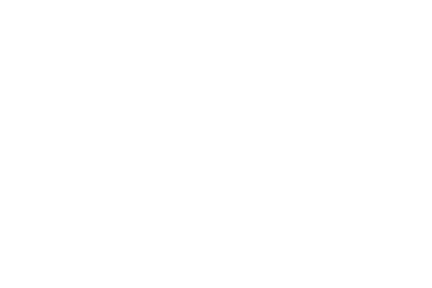

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial1.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


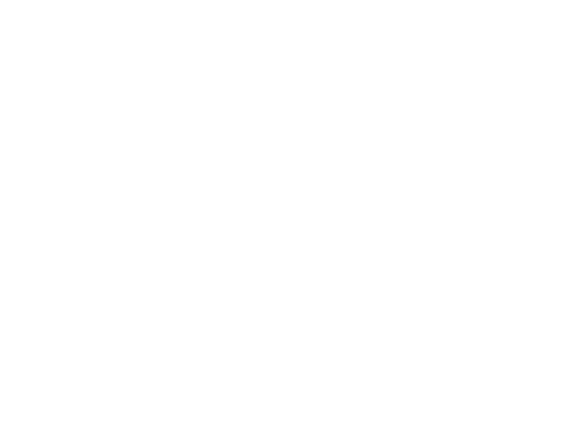

<IPython.core.display.Javascript object>


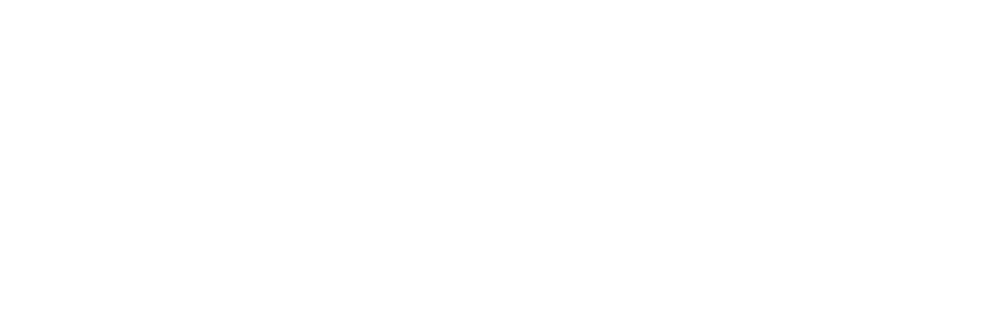

<IPython.core.display.Javascript object>


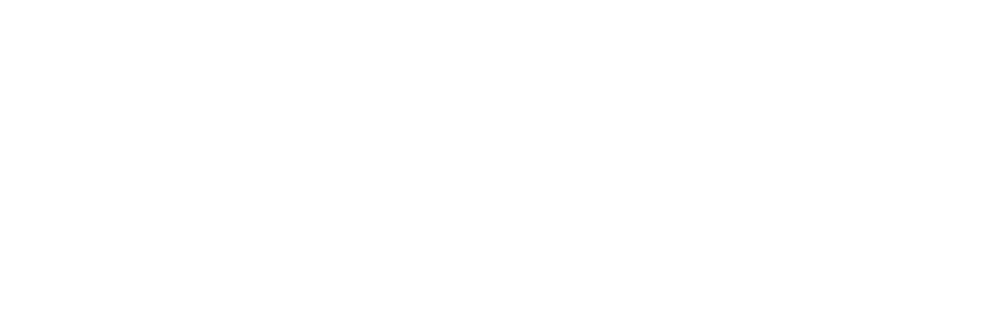

<IPython.core.display.Javascript object>


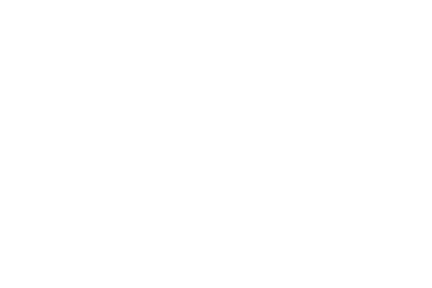

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial2.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


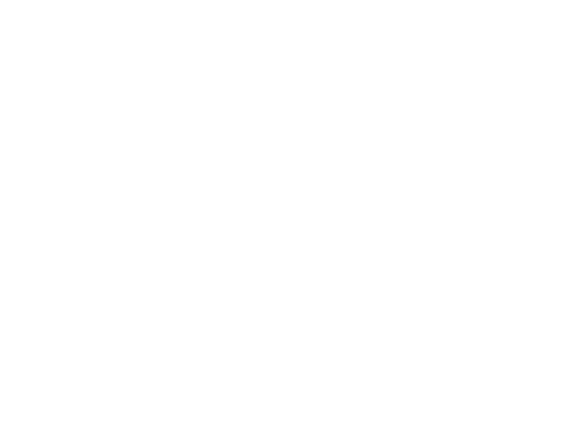

<IPython.core.display.Javascript object>


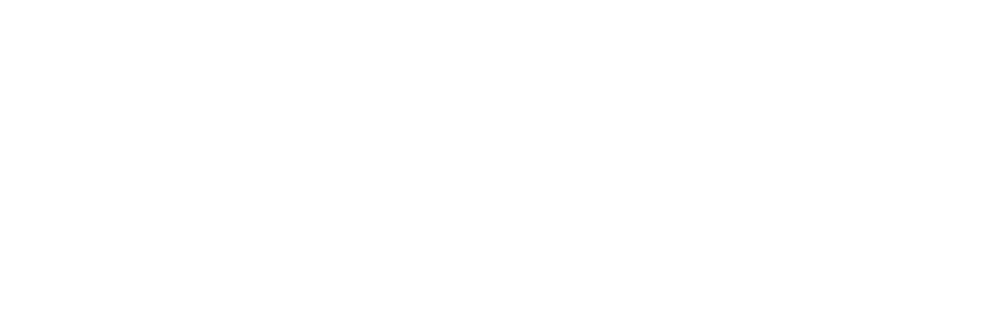

<IPython.core.display.Javascript object>


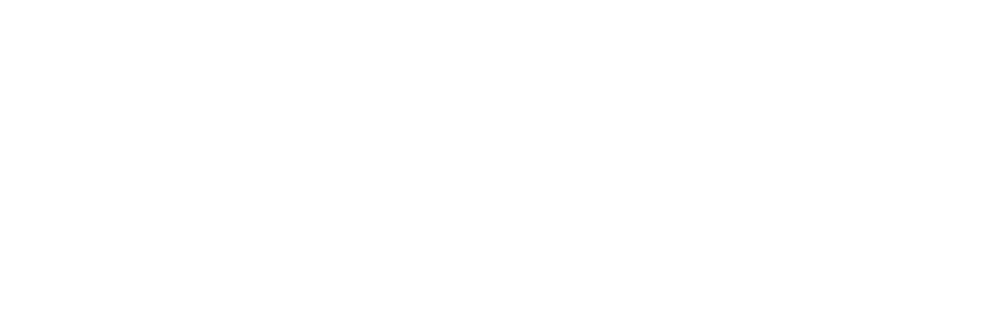

<IPython.core.display.Javascript object>


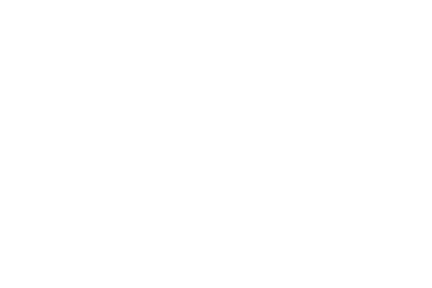

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial3.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


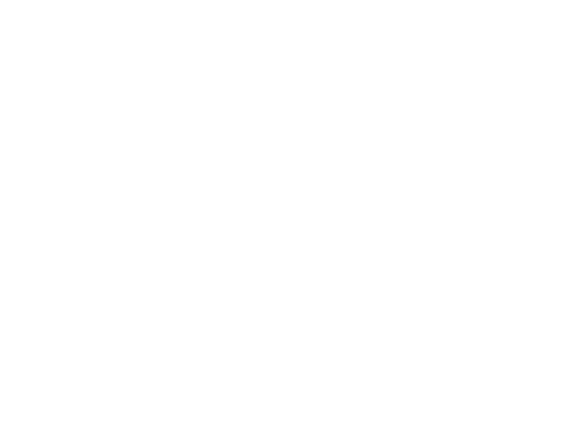

<IPython.core.display.Javascript object>


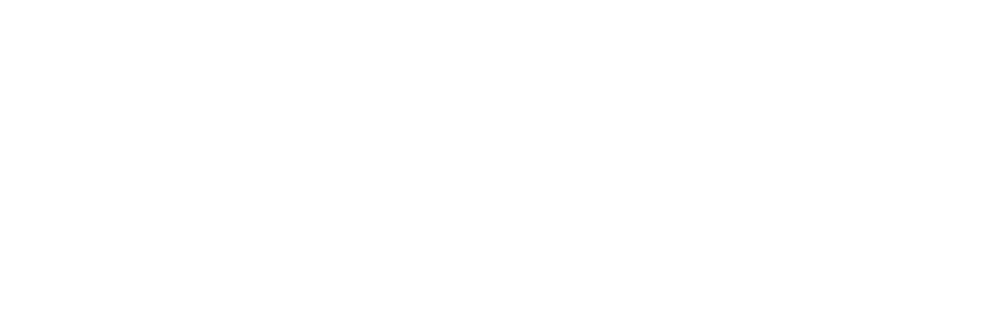

<IPython.core.display.Javascript object>


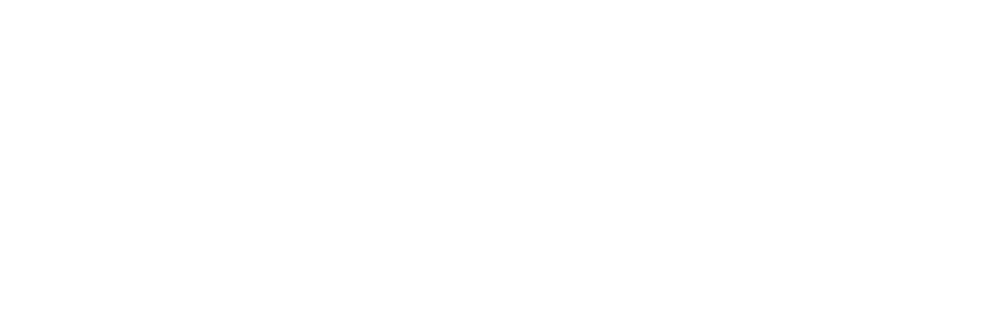

<IPython.core.display.Javascript object>


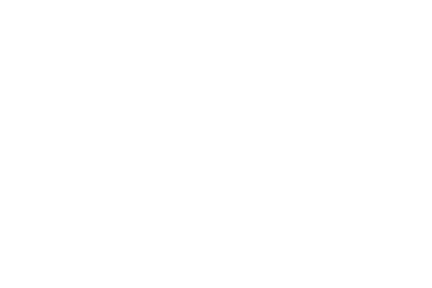

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial4.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


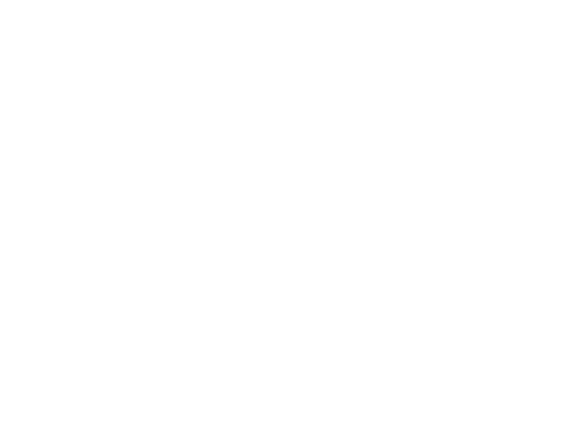

<IPython.core.display.Javascript object>


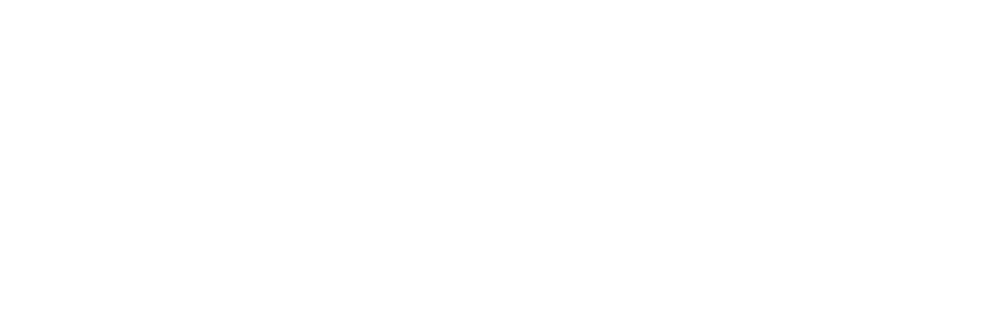

<IPython.core.display.Javascript object>


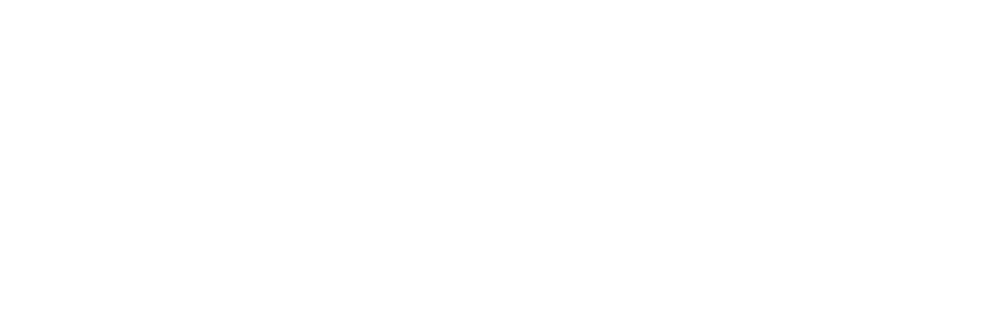

<IPython.core.display.Javascript object>


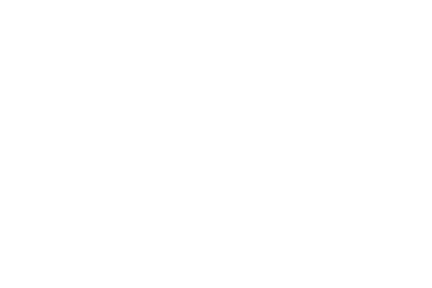

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial5.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


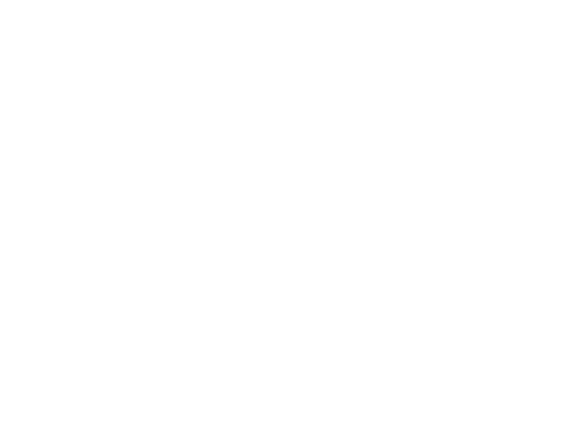

<IPython.core.display.Javascript object>


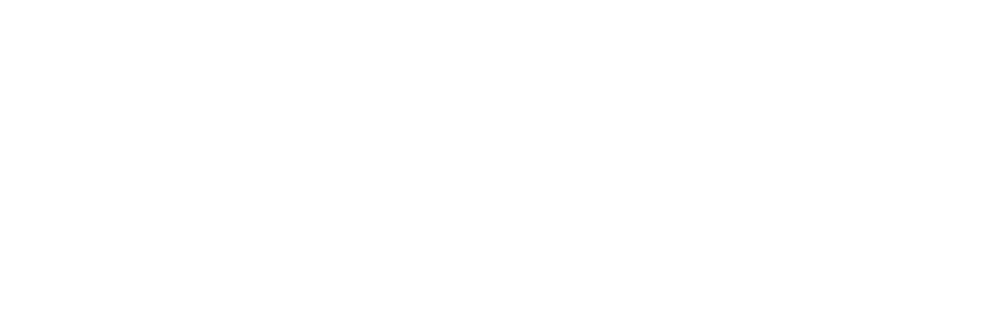

<IPython.core.display.Javascript object>


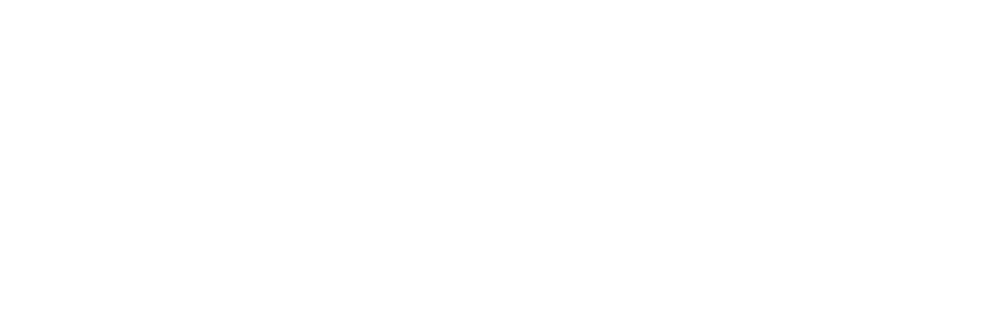

<IPython.core.display.Javascript object>


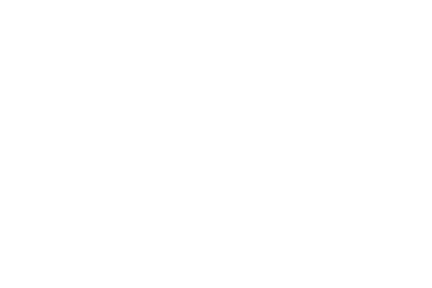

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial6.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


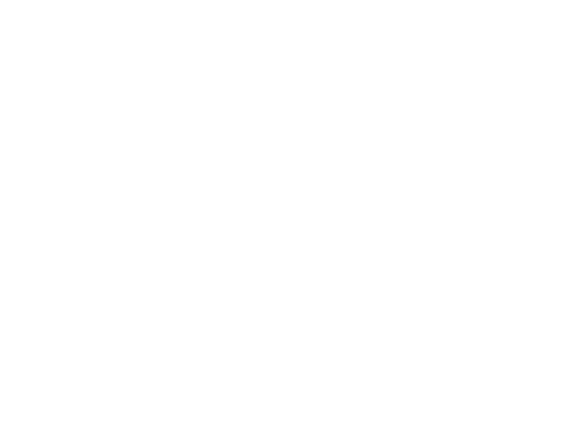

<IPython.core.display.Javascript object>


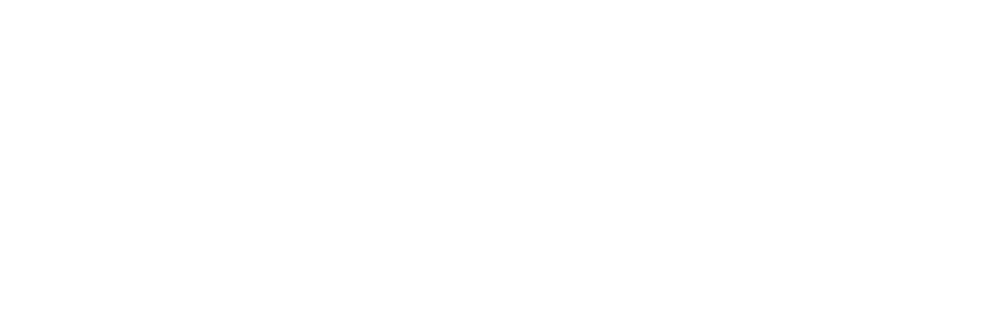

<IPython.core.display.Javascript object>


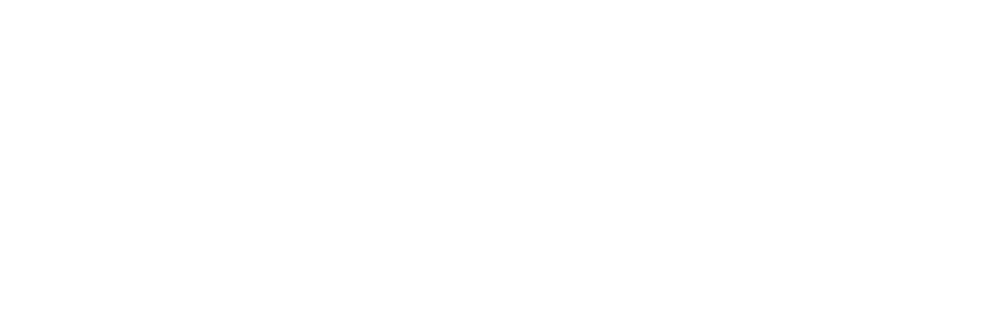

<IPython.core.display.Javascript object>


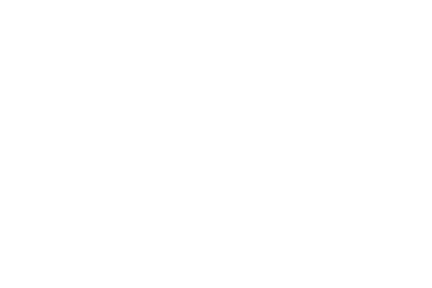

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial7.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


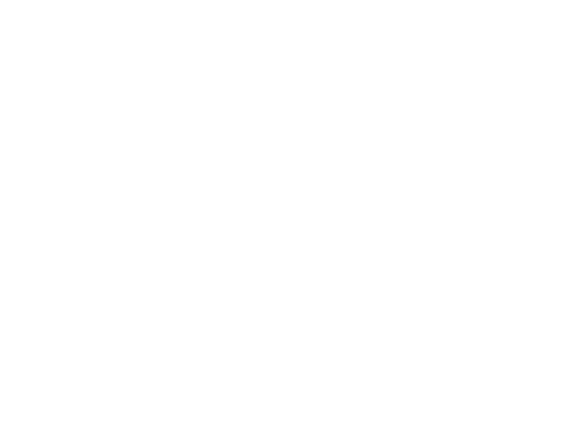

<IPython.core.display.Javascript object>


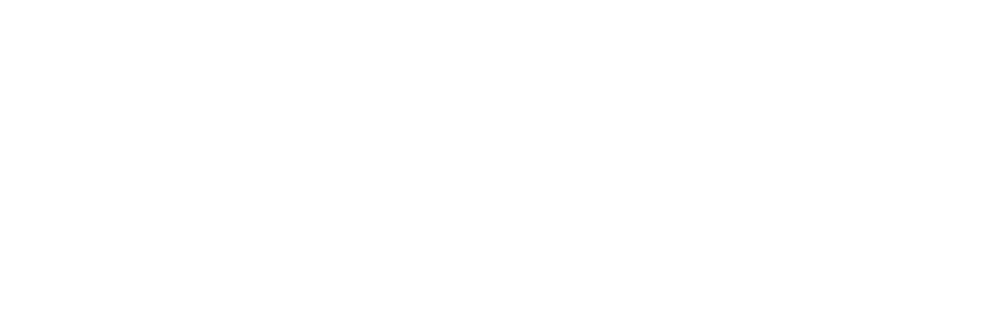

<IPython.core.display.Javascript object>


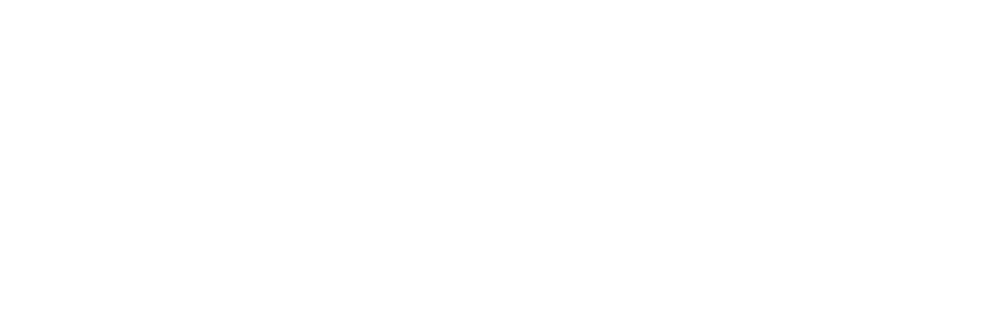

<IPython.core.display.Javascript object>


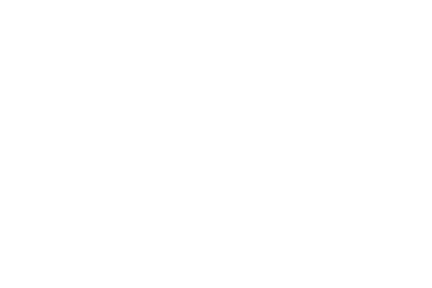

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial8.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


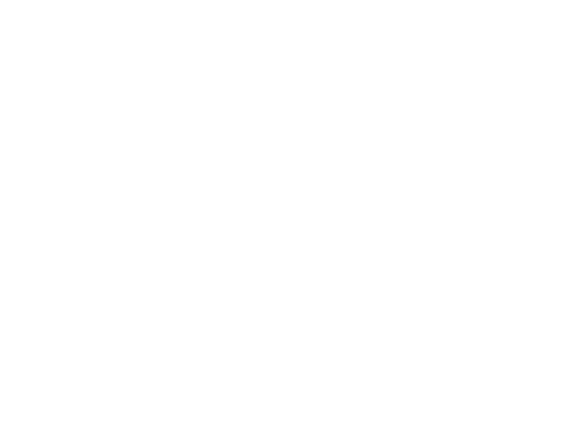

<IPython.core.display.Javascript object>


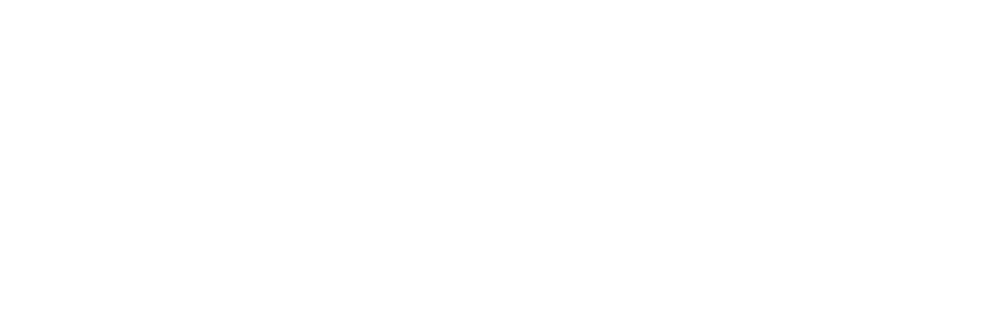

<IPython.core.display.Javascript object>


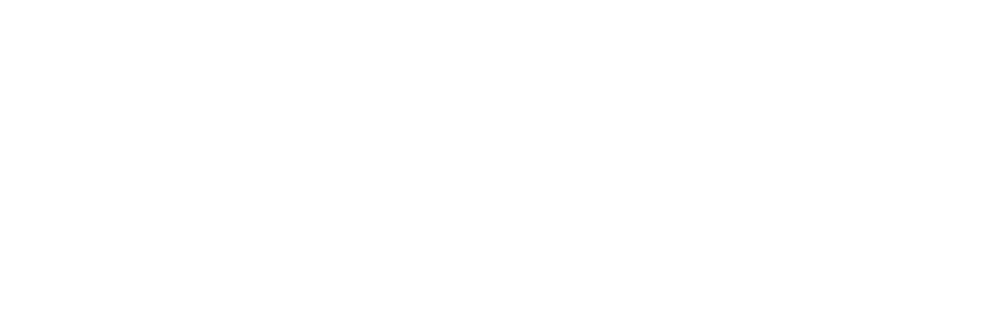

<IPython.core.display.Javascript object>


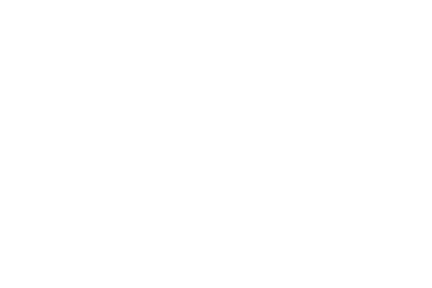

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial9.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


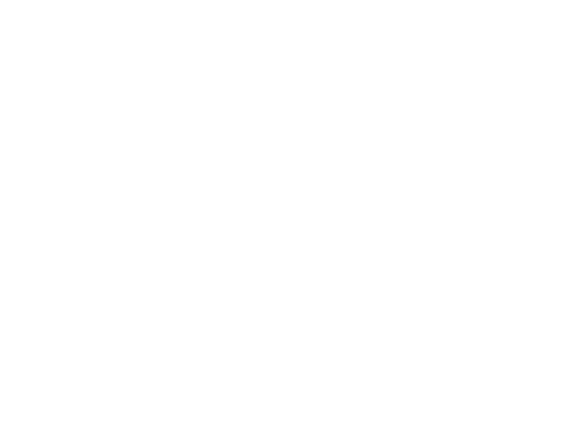

<IPython.core.display.Javascript object>


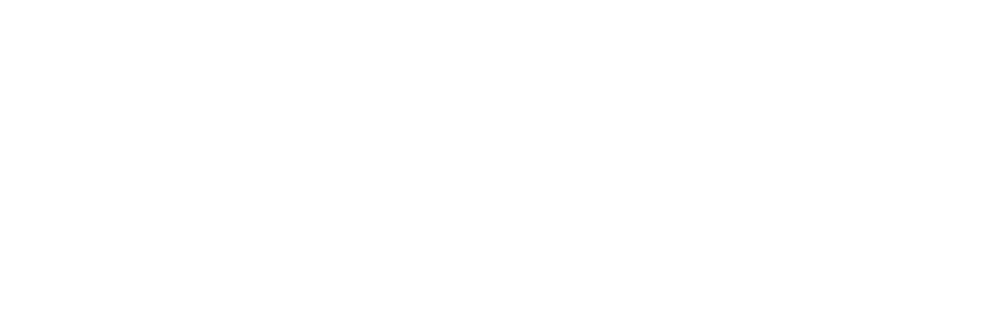

<IPython.core.display.Javascript object>


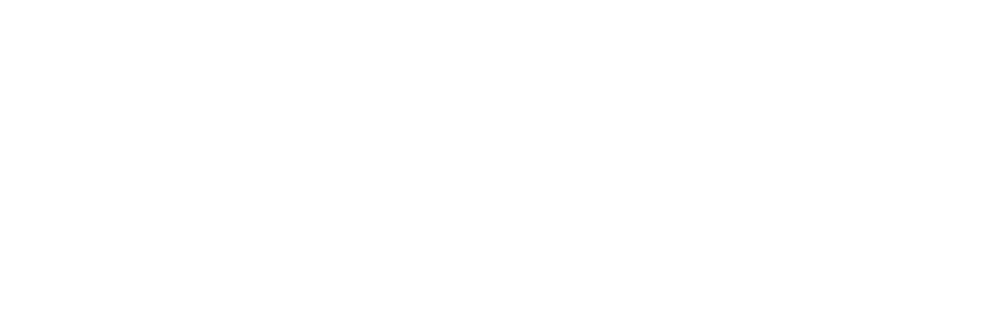

<IPython.core.display.Javascript object>


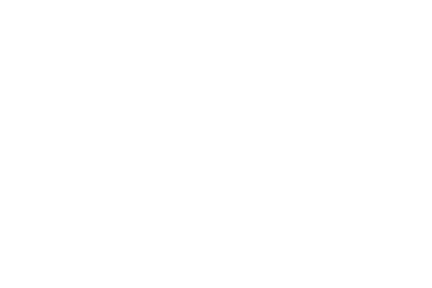

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial10.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


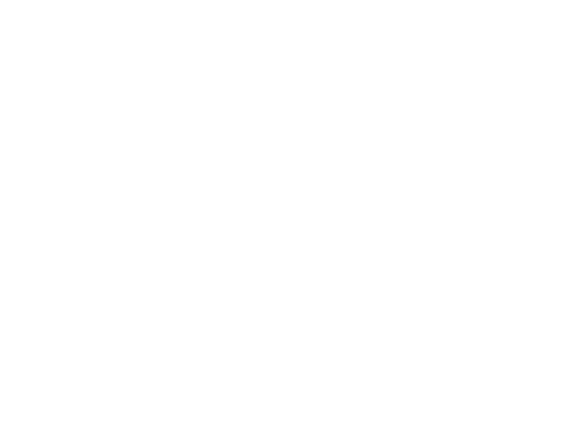

<IPython.core.display.Javascript object>


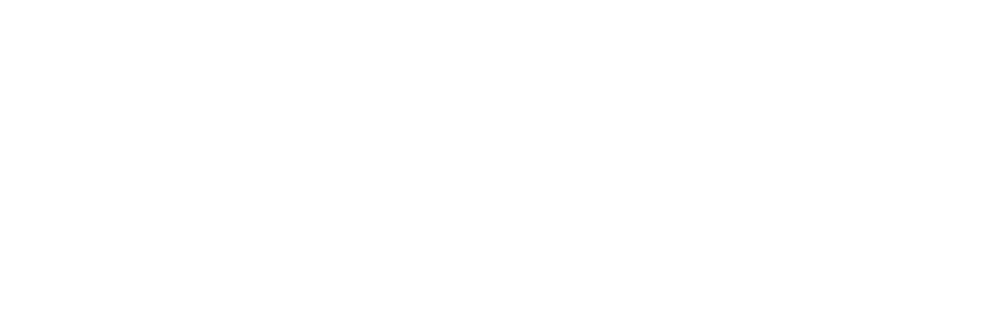

<IPython.core.display.Javascript object>


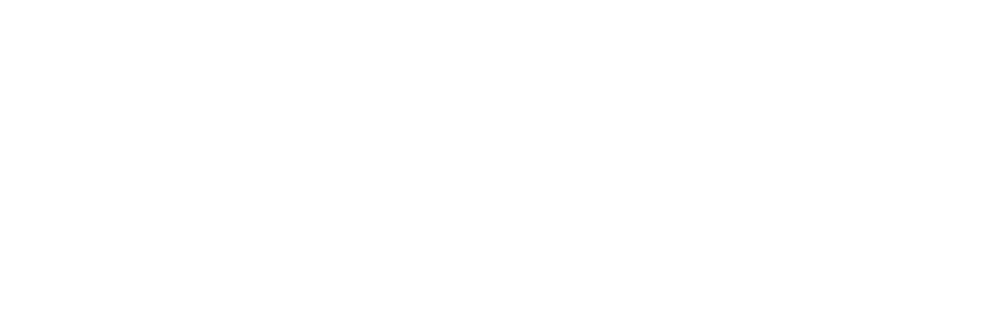

<IPython.core.display.Javascript object>


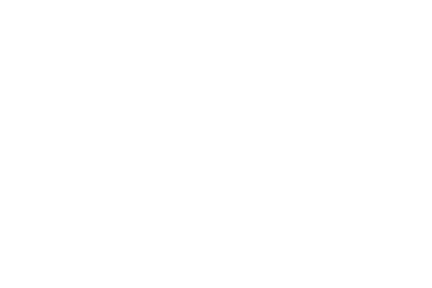

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial11.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


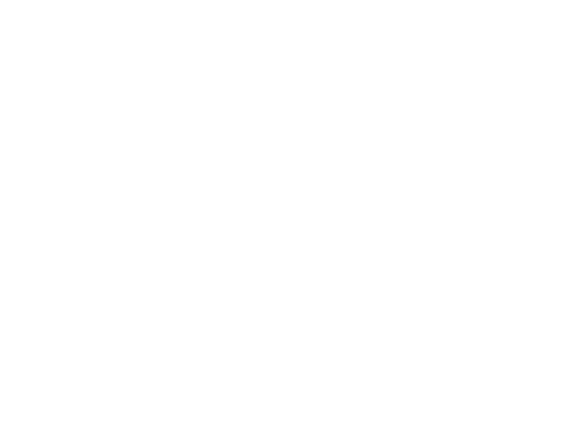

<IPython.core.display.Javascript object>


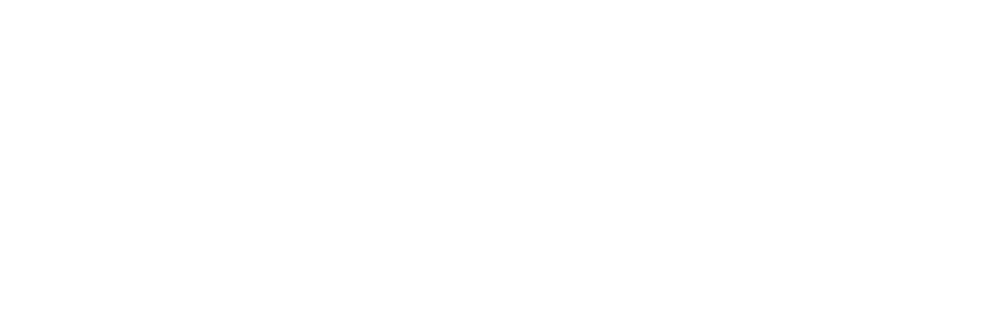

<IPython.core.display.Javascript object>


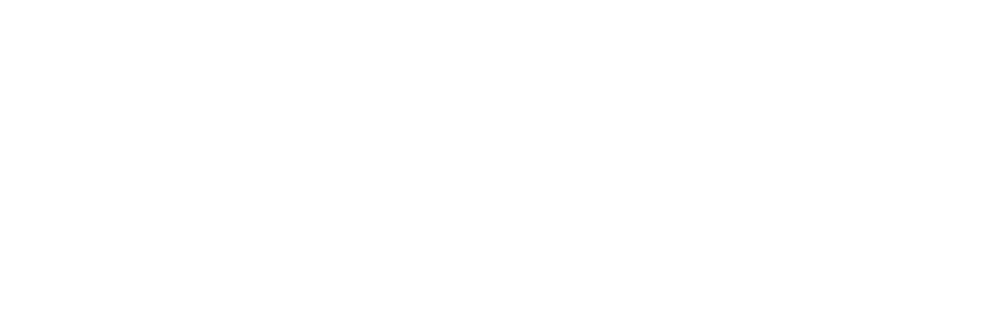

<IPython.core.display.Javascript object>


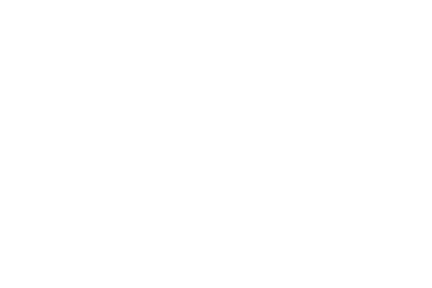

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial12.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


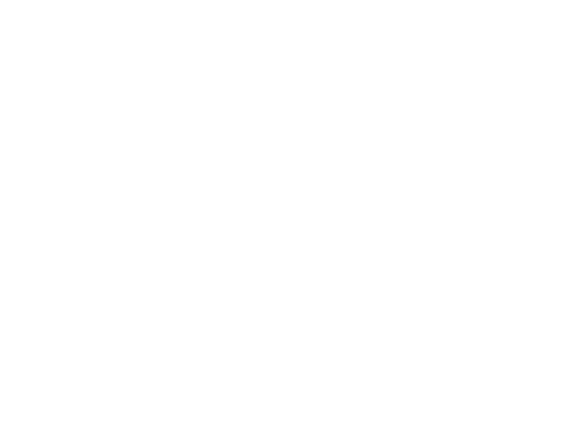

<IPython.core.display.Javascript object>


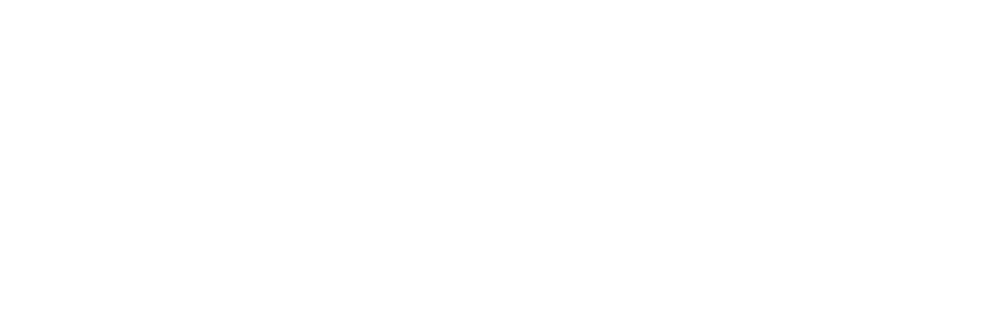

<IPython.core.display.Javascript object>


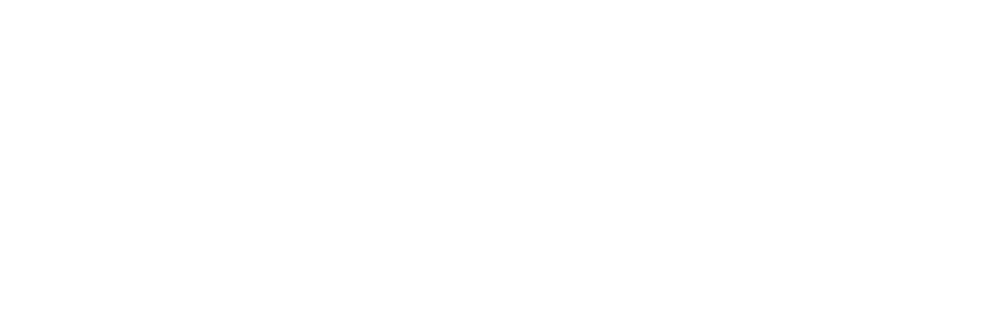

<IPython.core.display.Javascript object>


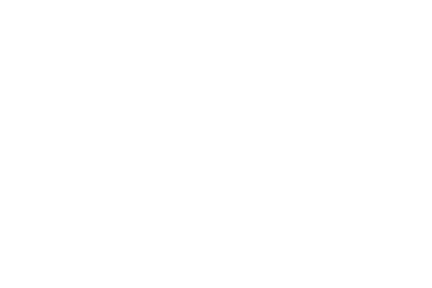

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial13.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


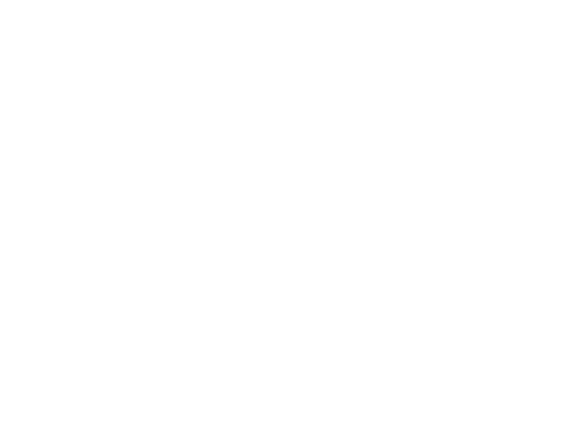

<IPython.core.display.Javascript object>


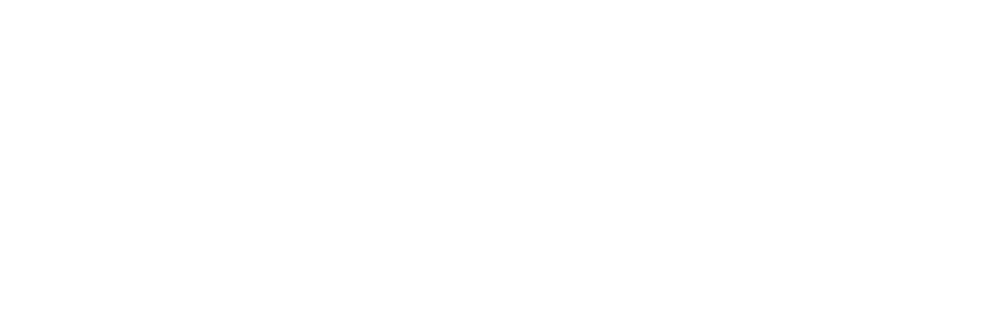

<IPython.core.display.Javascript object>


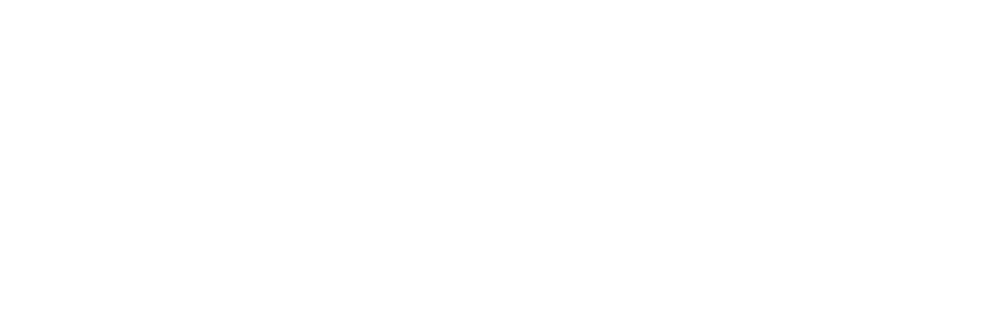

<IPython.core.display.Javascript object>


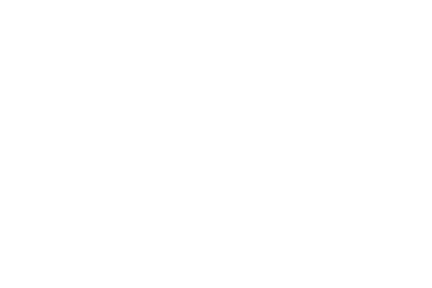

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial14.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


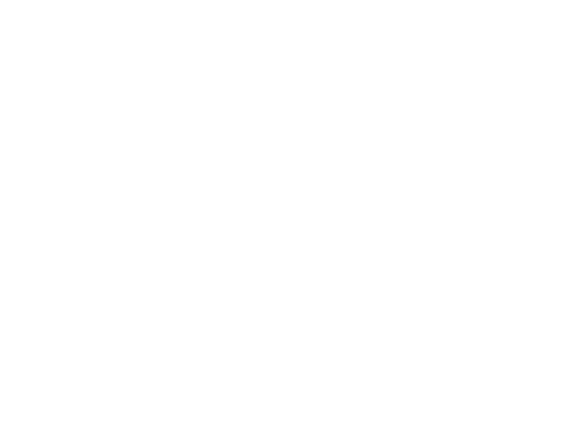

<IPython.core.display.Javascript object>


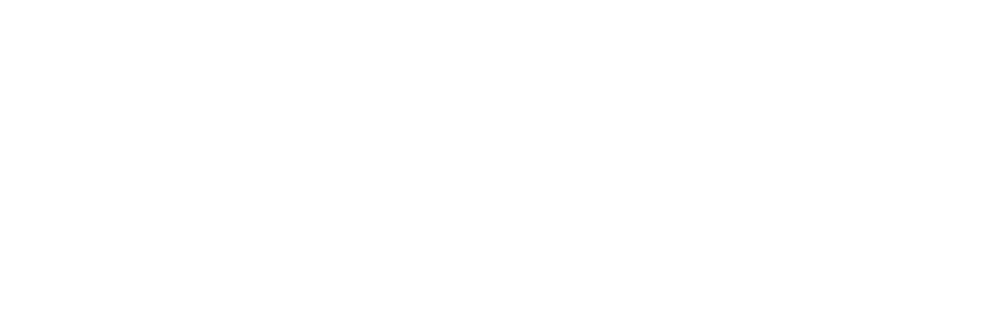

<IPython.core.display.Javascript object>


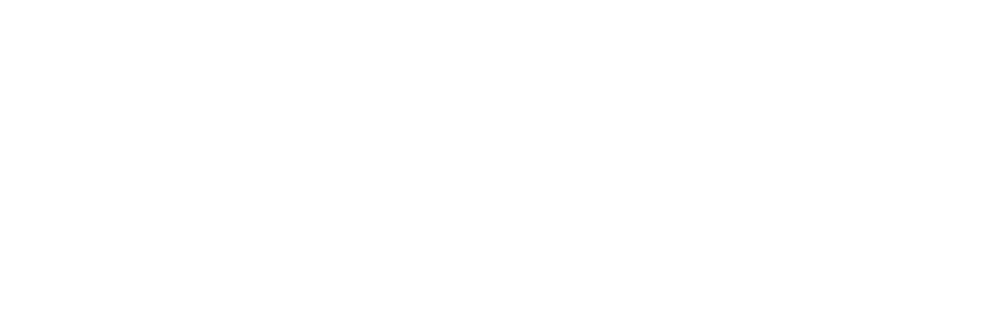

<IPython.core.display.Javascript object>


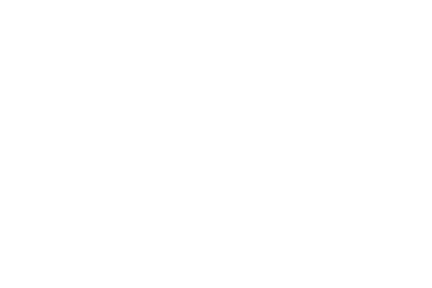

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial15.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


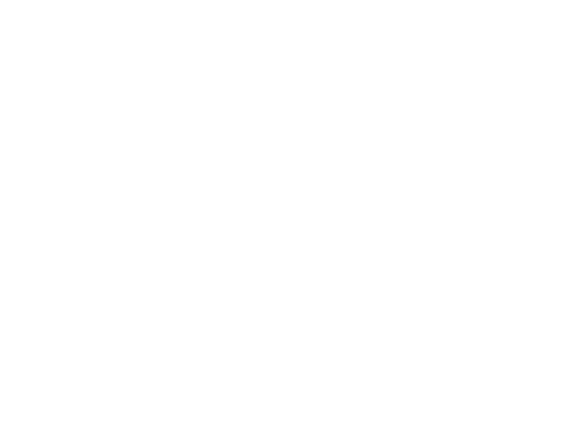

<IPython.core.display.Javascript object>


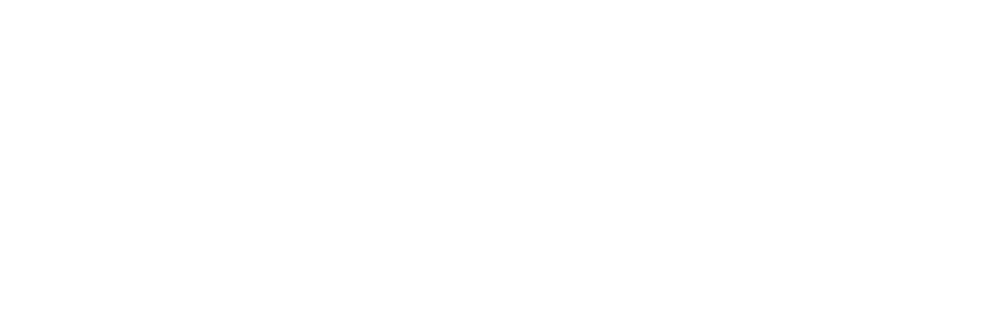

<IPython.core.display.Javascript object>


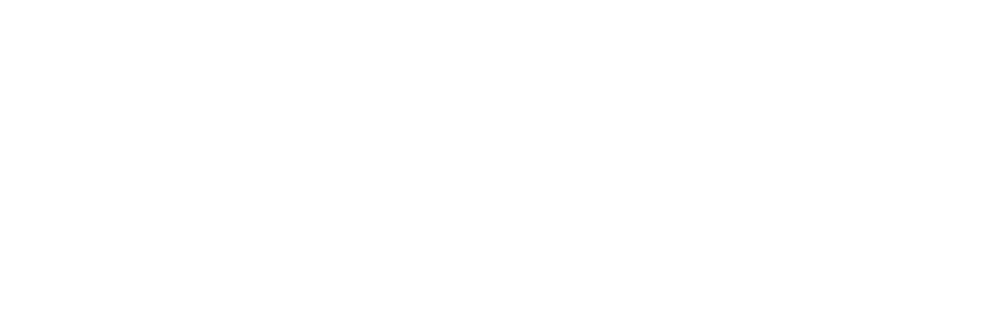

<IPython.core.display.Javascript object>


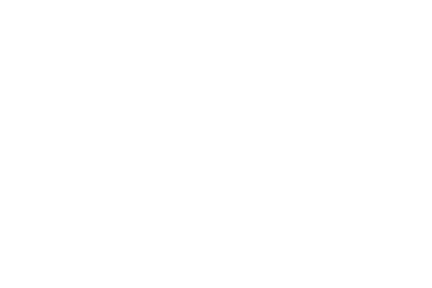

Plots created! Please check the directory "plot-poses" within the video directory


In [4]:
%matplotlib notebook
deeplabcut.plot_trajectories(path_config_file,videofile_path)